In [1]:
#手の表面を1フレームずつ画像に変換処理--(pro1)
import cv2
import os
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura","saitouhideakiomote",
      "saitouhideakiura","saitouryougaomote","saitouryougaura","sakumaomote","sakumaura",
      "tanakaomote","tanakaura","tochiomote","tochiura","tokuyamaomote","tokuyamaura",
      "watanabeomote","watanabeura","yamaguchiomote","yamaguchiura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura"]

for i in range(14):#変更必要
    save_dir="./binaryhands/"+str(output[i])
    cap=cv2.VideoCapture("./MOV/"+str(inputname[i])+".MOV")
    if not cap.isOpened():
        sys.exit()
    n= 0
    while True:
        # read()でフレーム画像が読み込めたかを示すbool、フレーム画像の配列ndarrayのタプル
        is_image,frame_img = cap.read()
        if is_image:
            # 画像を保存
            outfile=save_dir+"/"+str(n)+".jpg"
            #グレイスケール化
            im_gray = cv2.cvtColor(frame_img, cv2.COLOR_BGR2GRAY)
            cv2.imwrite(outfile, im_gray)
        else:
            # フレーム画像が読込なかったら終了
            break
        n += 1

    cap.release()
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok


In [10]:
#画像ファイルを読み込んでNumpy形式に変換--(pro2)
import numpy as np
from PIL import Image
import cv2
import os,glob,random

outfile="./num14graylight128.npz"#変更必要
max_photo=40000
photo_size=128#変更必要
x=[]
y=[]

def main():
    glob_files("./grayhands/mine/omote",0)
    glob_files("./grayhands/mine/ura",1)
    glob_files("./grayhands/okutani/omote",2)
    glob_files("./grayhands/okutani/ura",3)
    #glob_files("./hands/tochikubo/omote",4)
    #glob_files("./hands/tochikubo/ura",5)
    glob_files("./grayhands/nakamura/omote",4)
    glob_files("./grayhands/nakamura/ura",5)
    glob_files("./grayhands/gotou/omote",6)
    glob_files("./grayhands/gotou/ura",7)
    glob_files("./grayhands/mimura/omote",8)
    glob_files("./grayhands/mimura/ura",9)
    glob_files("./grayhands/arai/omote",10)
    glob_files("./grayhands/arai/ura",11)
    glob_files("./grayhands/isii/omote",12)
    glob_files("./grayhands/isii/ura",13)
    #glob_files("./hands/saitouhide/omote",16)
    #glob_files("./hands/saitouhide/ura",17)
    #glob_files("./hands/saitouryou/omote",18)
    #glob_files("./hands/saitouryou/ura",19)
    #glob_files("./hands/sakuma/omote",20)
    #glob_files("./hands/sakuma/ura",21)
    #glob_files("./hands/tanaka/omote",22)
    #glob_files("./hands/tanaka/ura",23)
    #glob_files("./hands/tokuyama/omote",24)
    #glob_files("./hands/tokuyama/ura",25)
    #glob_files("./hands/watanabe/omote",26)
    #glob_files("./hands/watanabe/ura",27)
    #glob_files("./hands/yamaguchi/omote",28)
    #glob_files("./hands/yamaguchi/ura",29)
    
    
    #glob_files("./hands/sekine/omote",30)
    #glob_files("./hands/sekine/ura",31)
    #glob_files("./hands/toriumi/omote",32)
    #glob_files("./hands/toriumi/ura",33)
    #glob_files("./hands/aizawa/omote",34)
    #glob_files("./hands/aizawa/ura",35)
    np.savez(outfile,x=x,y=y)
    print("保存しました:"+outfile,len(x))
    print(x[0],y[0])
    
def glob_files(path,label):
    files=glob.glob(path+"/*.jpg")
    random.shuffle(files)
    num=0
    for f in files:
        if num>=max_photo: break
        num+=1
        #img=Image.open(f)#RGBのコード
        #img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)#GRAYスケールの時のコード
        #img=img.resize((photo_size,photo_size))
        #img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        #---------Grayscaleの時のプログラム--------------
        img=cv2.imread(f)
        img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        img=cv2.resize(img_gray,(photo_size,photo_size))
        
        
        img=np.asarray(img)#1つの配列に格納（この場合2つ）
        x.append(img)
        y.append(label)
if __name__=='__main__':
    main()

保存しました:./num14graylight128.npz 3051
[[132 131 131 ... 177 179 181]
 [130 129 129 ... 187 190 190]
 [129 131 130 ... 192 194 192]
 ...
 [158 157 160 ... 151 149 143]
 [157 158 159 ... 146 145 148]
 [157 158 159 ... 143 145 145]] 0


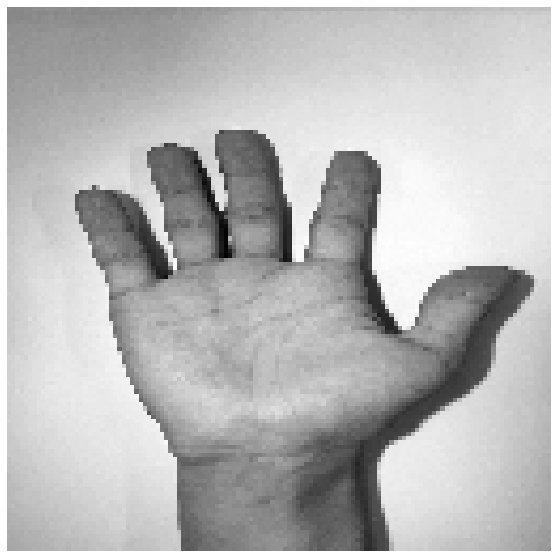

In [27]:
#pro2のnumpyファイルが正しく保存されているかの確認プログラム
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#写真データ読み込み
photos=np.load('./num14graylight128.npz')
x=photos['x']
y=photos['y']
#開始インデックス
idx=1900
#pyplotで出力
plt.figure(figsize=(10,10))
plt.axis("off")

#image = plt.imread(x[20])
#image.shape
#plt.imsave('./extract.jpg', image)

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.axis("off")
    #グレイスケール画像を読み込むときは、plt.grayが必要
    #plt.gray
    plt.title(y[i+idx])
    plt.imshow(x[i+idx],cmap='gray')
    plt.savefig('./extract.jpg')

#--------------------画像1枚をピックアップして保存する-----------------------------
#plt.imshow(x[0],cmap='gray')
#plt.savefig('./extract.jpg')
plt.show()

Epoch 1/20
77/77 [==============================] - 57s 740ms/step - loss: 1.0799 - accuracy: 0.7348 - val_loss: 0.0056 - val_accuracy: 0.9967
Epoch 2/20
77/77 [==============================] - 56s 724ms/step - loss: 0.0067 - accuracy: 0.9980 - val_loss: 2.7303e-05 - val_accuracy: 1.0000
Epoch 3/20
77/77 [==============================] - 55s 712ms/step - loss: 1.2481 - accuracy: 0.9852 - val_loss: 3.5899e-08 - val_accuracy: 1.0000
Epoch 4/20
77/77 [==============================] - 57s 735ms/step - loss: 5.0433e-05 - accuracy: 1.0000 - val_loss: 1.0536e-07 - val_accuracy: 1.0000
Epoch 5/20
77/77 [==============================] - 56s 728ms/step - loss: 0.1950 - accuracy: 0.9877 - val_loss: 5.6244e-07 - val_accuracy: 1.0000
Epoch 6/20
77/77 [==============================] - 54s 706ms/step - loss: 4.6629e-05 - accuracy: 1.0000 - val_loss: 6.7182e-07 - val_accuracy: 1.0000
Epoch 7/20
77/77 [==============================] - 54s 706ms/step - loss: 5.1732e-06 - accuracy: 1.0000 - val_los

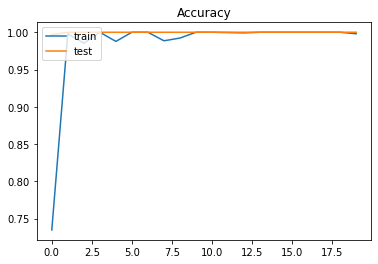

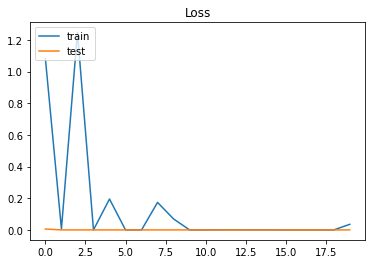

Wall time: 18min 33s


In [3]:
%%time
#CNNモデルの構築とCNNモデルを用いた機械学習--(pro3)
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model

def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model


im_rows = 128 # 変更必要
im_cols = 128 # 変更必要
im_color = 1
in_shape = (im_rows, im_cols, im_color)
nb_classes = 14 #変更必要

photos = np.load('./num14graylight128.npz')#変更必要
x = photos['x']
y = photos['y']

x = x.reshape(-1, im_rows, im_cols, im_color)
x = x.astype('float32') / 255
y = keras.utils.to_categorical(y.astype('int32'), nb_classes)

x_train, x_test, y_train, y_test = train_test_split(
    x, y, train_size=0.8)

model = get_model(in_shape, nb_classes)


hist = model.fit(x_train, y_train,
          batch_size=32,
          epochs=20,
          verbose=1,
          validation_data=(x_test, y_test))

score = model.evaluate(x_test, y_test, verbose=1)
print('正解率=', score[1], 'loss=', score[0])


plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

model.save_weights('./hdf/num14graylight128pix.hdf5') #変更必要


ここからは0番目の写真です


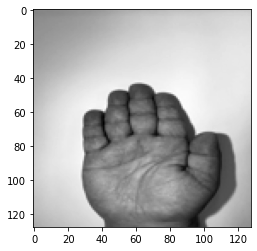

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは1番目の写真です


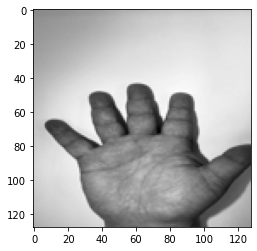

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは2番目の写真です


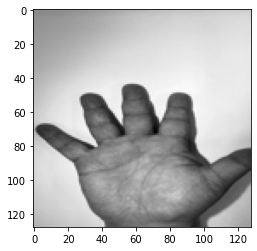

この写真は、 中村君の裏 です。
可能性は、 100.0 %です。

ここからは3番目の写真です


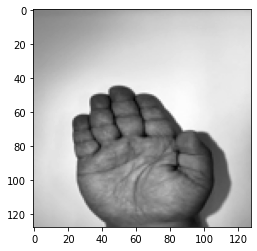

可能性が 95.21680474281311 %なので認証できません。
認証の結果は 中村君の表 でした。

ここからは4番目の写真です


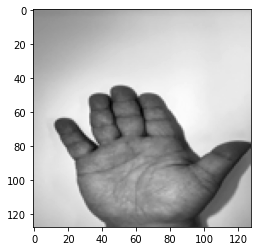

この写真は、 中村君の表 です。
可能性は、 100.0 %です。

ここからは5番目の写真です


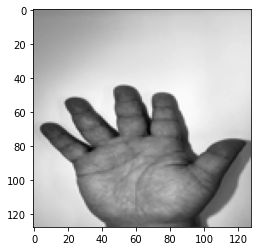

この写真は、 中村君の表 です。
可能性は、 100.0 %です。

ここからは6番目の写真です


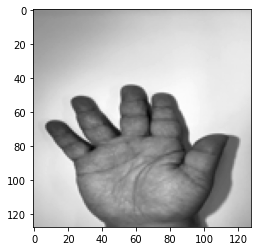

可能性が 31.003007292747498 %なので認証できません。
認証の結果は 中村君の裏 でした。

ここからは7番目の写真です


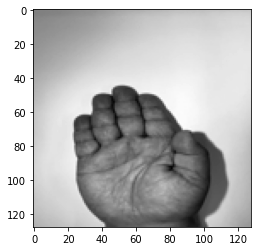

可能性が 98.88424873352051 %なので認証できません。
認証の結果は 中村君の表 でした。

ここからは8番目の写真です


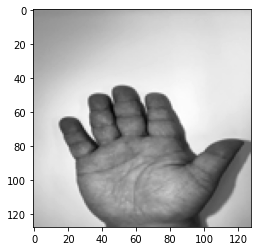

この写真は、 中村君の表 です。
可能性は、 100.0 %です。

ここからは9番目の写真です


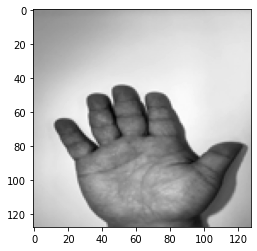

この写真は、 中村君の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは10番目の写真です


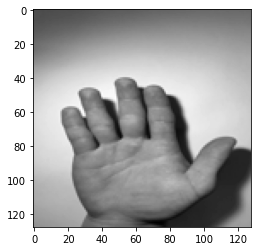

この写真は、 中村君の表 です。
可能性は、 99.99898672103882 %です。

ここからは11番目の写真です


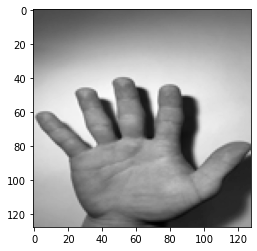

この写真は、 新井さんの表 です。
可能性は、 99.112468957901 %です。

ここからは12番目の写真です


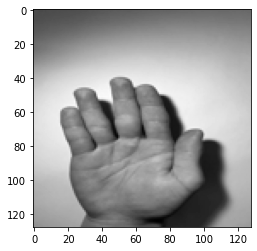

この写真は、 三村君の表 です。
可能性は、 99.9910831451416 %です。

ここからは13番目の写真です


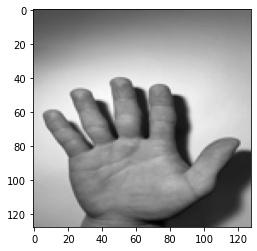

この写真は、 中村君の表 です。
可能性は、 99.99806880950928 %です。

ここからは14番目の写真です


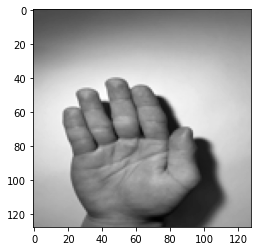

この写真は、 新井さんの表 です。
可能性は、 99.9943733215332 %です。

ここからは15番目の写真です


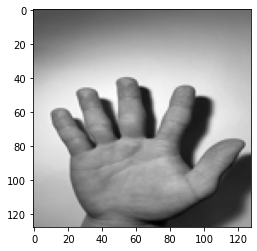

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは16番目の写真です


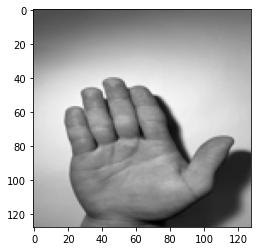

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは17番目の写真です


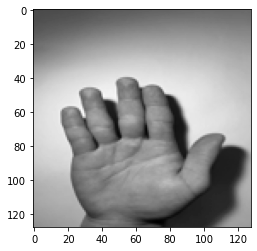

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは18番目の写真です


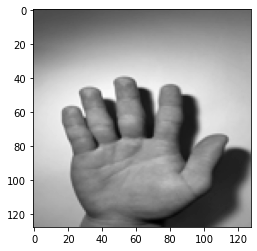

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは19番目の写真です


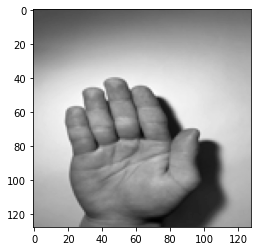

この写真は、 新井さんの表 です。
可能性は、 99.70435500144958 %です。
テスト対象の人が変わります

ここからは20番目の写真です


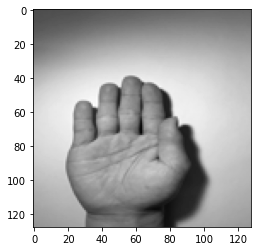

この写真は、 新井さんの表 です。
可能性は、 99.32458996772766 %です。

ここからは21番目の写真です


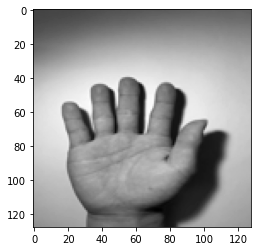

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは22番目の写真です


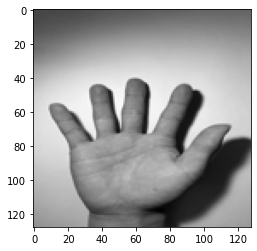

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは23番目の写真です


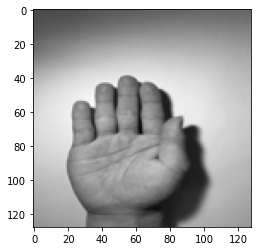

この写真は、 新井さんの表 です。
可能性は、 99.92191791534424 %です。

ここからは24番目の写真です


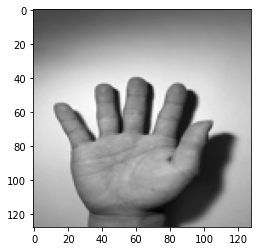

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは25番目の写真です


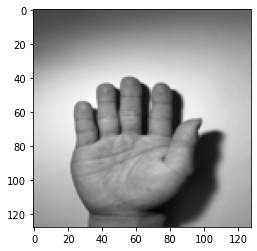

この写真は、 新井さんの表 です。
可能性は、 99.02722239494324 %です。

ここからは26番目の写真です


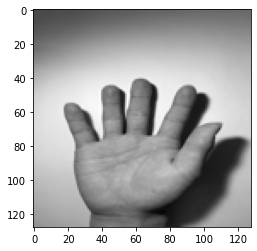

この写真は、 新井さんの表 です。
可能性は、 99.99996423721313 %です。

ここからは27番目の写真です


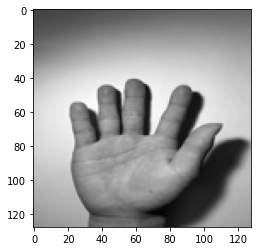

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは28番目の写真です


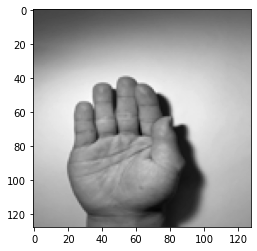

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは29番目の写真です


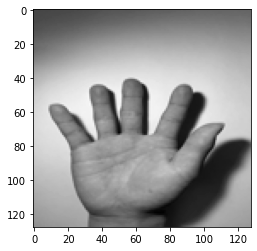

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは30番目の写真です


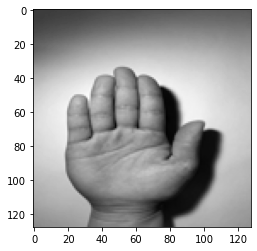

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは31番目の写真です


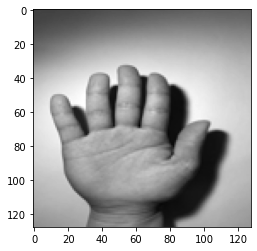

この写真は、 三村君の表 です。
可能性は、 99.8005211353302 %です。

ここからは32番目の写真です


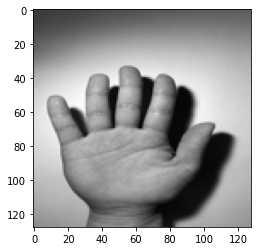

可能性が 73.91543984413147 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは33番目の写真です


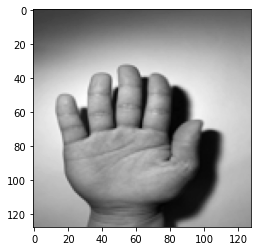

可能性が 56.555235385894775 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは34番目の写真です


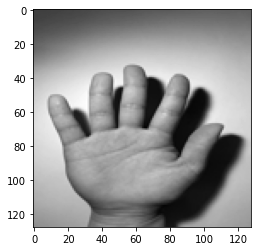

この写真は、 三村君の表 です。
可能性は、 99.99796152114868 %です。

ここからは35番目の写真です


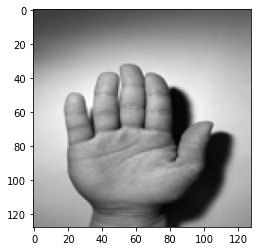

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは36番目の写真です


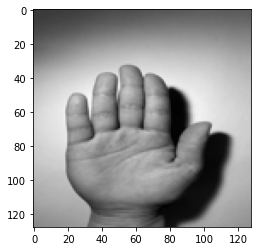

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは37番目の写真です


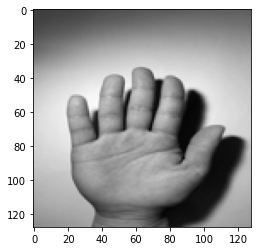

この写真は、 三村君の表 です。
可能性は、 99.99628067016602 %です。

ここからは38番目の写真です


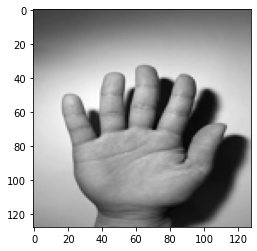

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは39番目の写真です


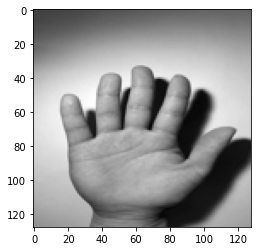

この写真は、 三村君の表 です。
可能性は、 99.8448371887207 %です。
テスト対象の人が変わります

ここからは40番目の写真です


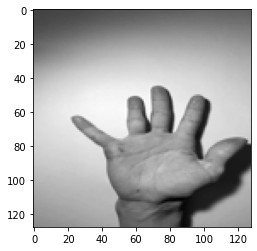

可能性が 82.21654295921326 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは41番目の写真です


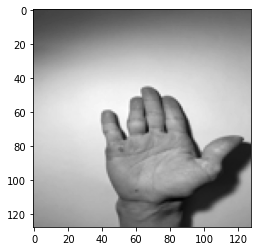

この写真は、 三村君の表 です。
可能性は、 99.73177313804626 %です。

ここからは42番目の写真です


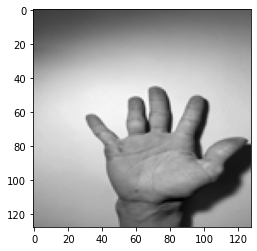

可能性が 97.57934212684631 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは43番目の写真です


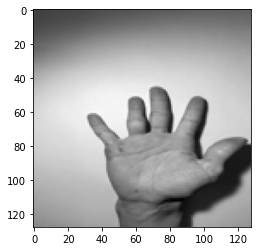

可能性が 95.23389339447021 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは44番目の写真です


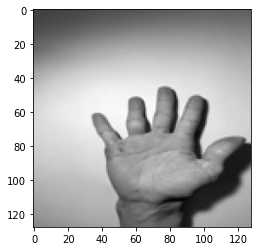

この写真は、 三村君の表 です。
可能性は、 99.95023012161255 %です。

ここからは45番目の写真です


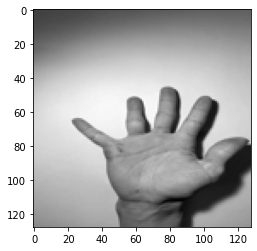

この写真は、 中村君の表 です。
可能性は、 99.99797344207764 %です。

ここからは46番目の写真です


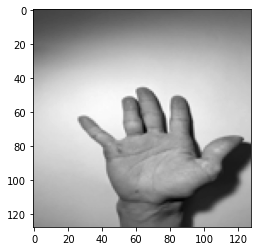

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは47番目の写真です


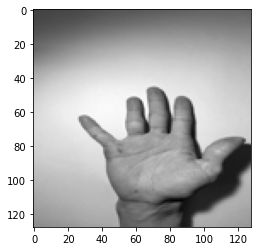

この写真は、 三村君の表 です。
可能性は、 99.99943971633911 %です。

ここからは48番目の写真です


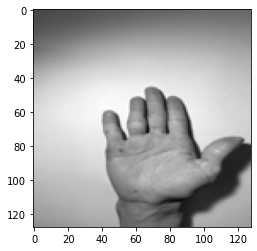

可能性が 98.77681136131287 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは49番目の写真です


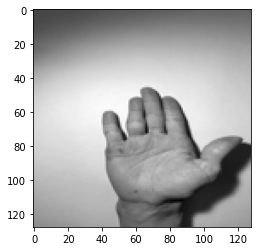

可能性が 77.18291878700256 %なので認証できません。
認証の結果は 三村君の表 でした。
テスト対象の人が変わります

ここからは50番目の写真です


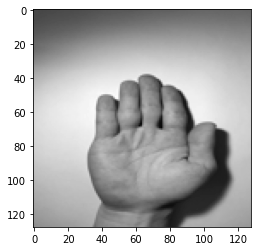

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは51番目の写真です


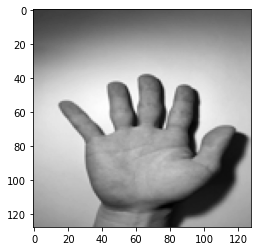

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは52番目の写真です


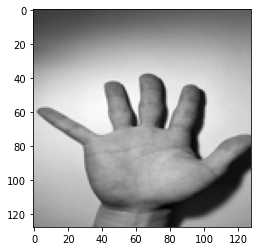

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは53番目の写真です


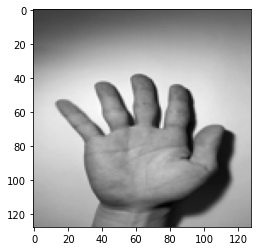

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは54番目の写真です


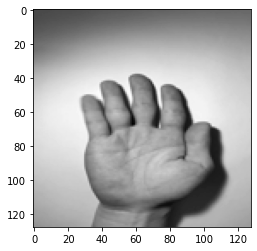

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは55番目の写真です


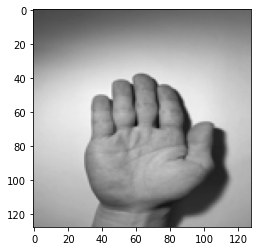

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは56番目の写真です


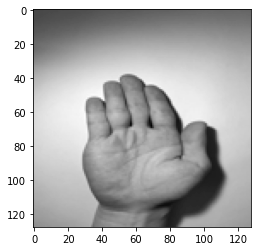

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは57番目の写真です


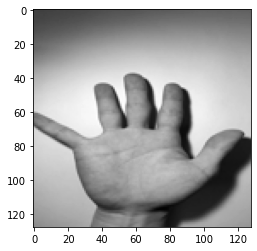

この写真は、 新井さんの表 です。
可能性は、 99.90319013595581 %です。

ここからは58番目の写真です


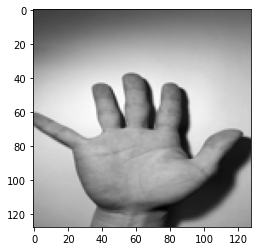

この写真は、 新井さんの表 です。
可能性は、 99.99997615814209 %です。

ここからは59番目の写真です


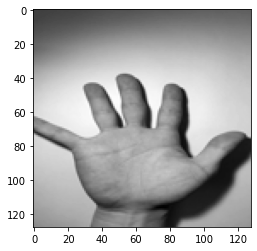

この写真は、 中村君の表 です。
可能性は、 99.99374151229858 %です。
テスト対象の人が変わります

ここからは60番目の写真です


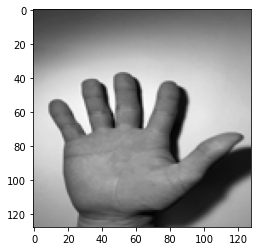

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは61番目の写真です


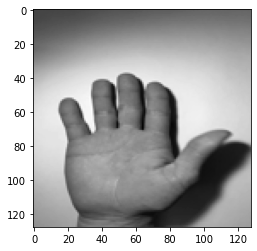

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは62番目の写真です


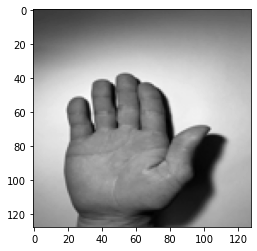

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは63番目の写真です


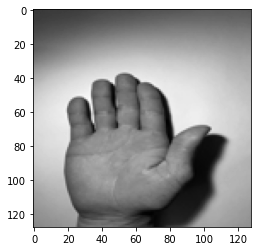

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは64番目の写真です


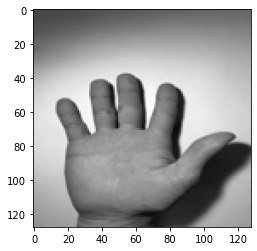

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは65番目の写真です


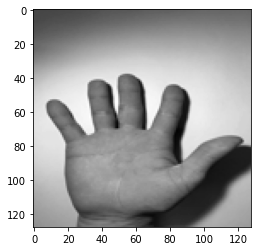

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは66番目の写真です


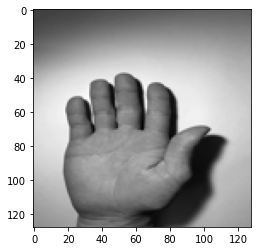

この写真は、 新井さんの表 です。
可能性は、 99.99988079071045 %です。

ここからは67番目の写真です


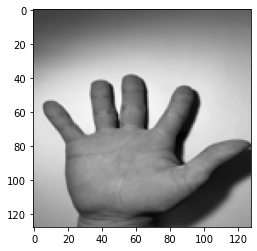

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは68番目の写真です


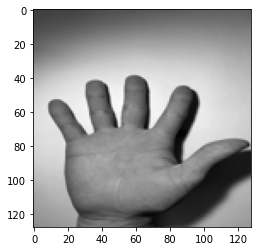

この写真は、 新井さんの表 です。
可能性は、 100.0 %です。

ここからは69番目の写真です


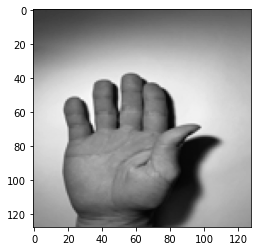

この写真は、 新井さんの表 です。
可能性は、 99.99963045120239 %です。
テスト対象の人が変わります

ここからは70番目の写真です


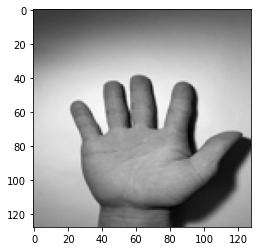

この写真は、 三村君の表 です。
可能性は、 99.99995231628418 %です。

ここからは71番目の写真です


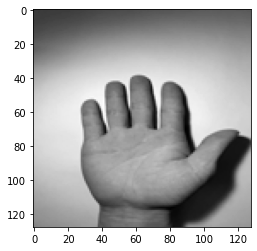

この写真は、 三村君の表 です。
可能性は、 99.9998927116394 %です。

ここからは72番目の写真です


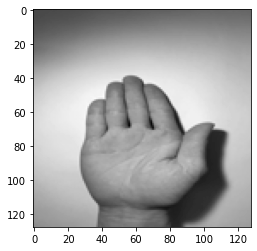

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは73番目の写真です


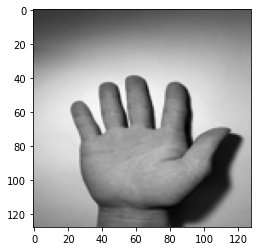

この写真は、 三村君の表 です。
可能性は、 99.99998807907104 %です。

ここからは74番目の写真です


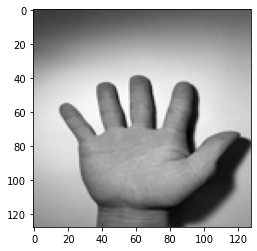

可能性が 81.29954934120178 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは75番目の写真です


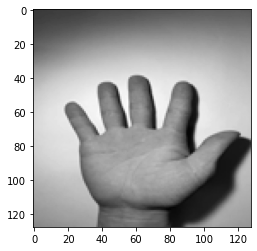

可能性が 65.22691249847412 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは76番目の写真です


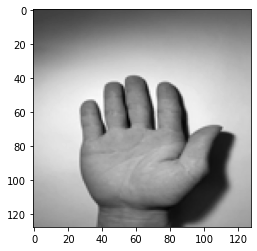

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは77番目の写真です


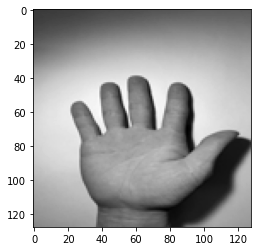

この写真は、 三村君の表 です。
可能性は、 99.9976634979248 %です。

ここからは78番目の写真です


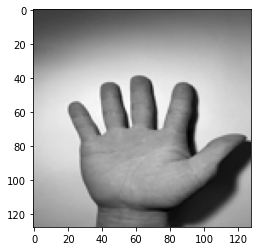

この写真は、 三村君の表 です。
可能性は、 99.66983199119568 %です。

ここからは79番目の写真です


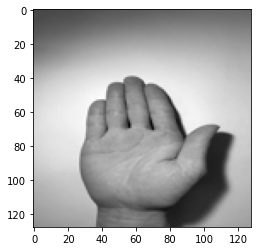

この写真は、 三村君の表 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは0番目の写真です


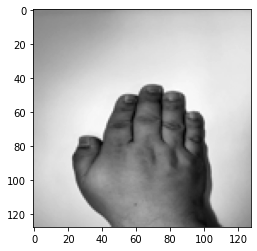

この写真は、 中村君の裏 です。
可能性は、 99.9998688697815 %です。

ここからは1番目の写真です


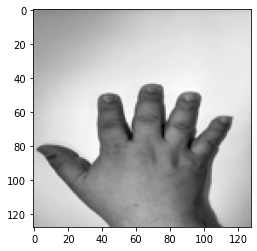

この写真は、 中村君の裏 です。
可能性は、 100.0 %です。

ここからは2番目の写真です


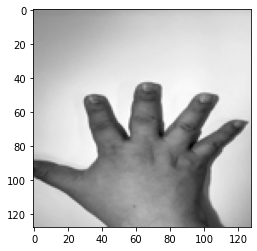

この写真は、 中村君の裏 です。
可能性は、 100.0 %です。

ここからは3番目の写真です


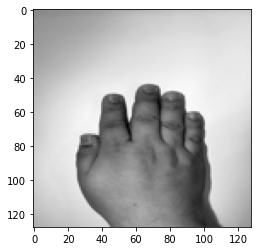

この写真は、 中村君の裏 です。
可能性は、 100.0 %です。

ここからは4番目の写真です


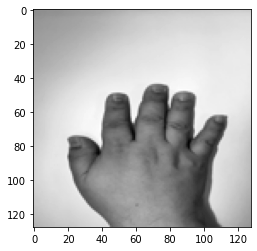

この写真は、 中村君の裏 です。
可能性は、 99.99403953552246 %です。

ここからは5番目の写真です


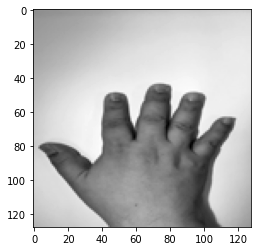

可能性が 70.78482508659363 %なので認証できません。
認証の結果は 中村君の裏 でした。

ここからは6番目の写真です


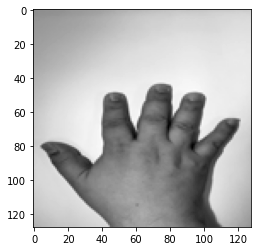

可能性が 94.18807029724121 %なので認証できません。
認証の結果は 石井さんの裏 でした。

ここからは7番目の写真です


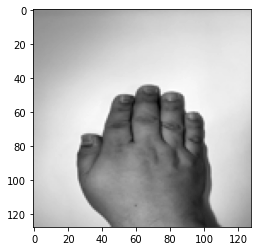

この写真は、 中村君の裏 です。
可能性は、 100.0 %です。

ここからは8番目の写真です


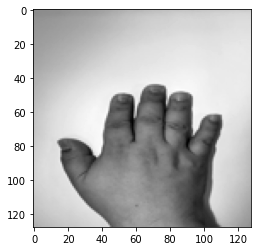

この写真は、 奥谷君の裏 です。
可能性は、 99.81498718261719 %です。

ここからは9番目の写真です


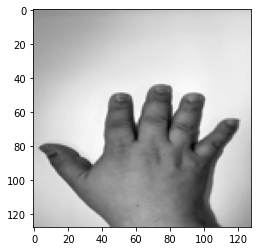

この写真は、 石井さんの裏 です。
可能性は、 99.99998807907104 %です。
テスト対象の人が変わります

ここからは10番目の写真です


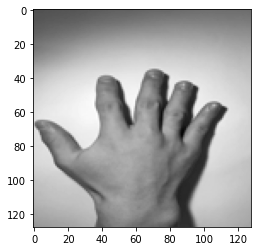

この写真は、 奥谷君の裏 です。
可能性は、 99.99998807907104 %です。

ここからは11番目の写真です


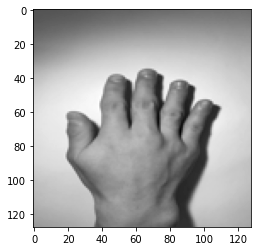

この写真は、 奥谷君の裏 です。
可能性は、 99.98900890350342 %です。

ここからは12番目の写真です


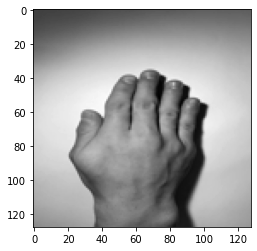

可能性が 70.75880765914917 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは13番目の写真です


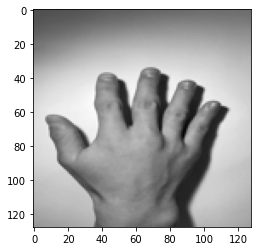

この写真は、 奥谷君の裏 です。
可能性は、 100.0 %です。

ここからは14番目の写真です


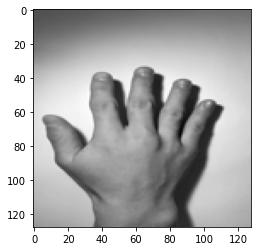

この写真は、 奥谷君の裏 です。
可能性は、 99.81309771537781 %です。

ここからは15番目の写真です


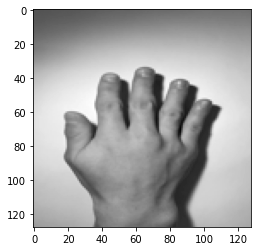

この写真は、 奥谷君の裏 です。
可能性は、 99.78786706924438 %です。

ここからは16番目の写真です


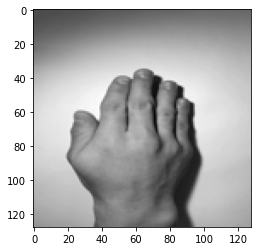

可能性が 97.7626383304596 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは17番目の写真です


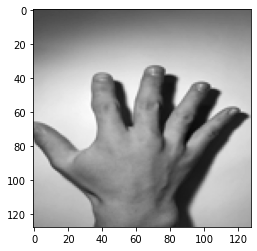

この写真は、 三村君の表 です。
可能性は、 99.62192177772522 %です。

ここからは18番目の写真です


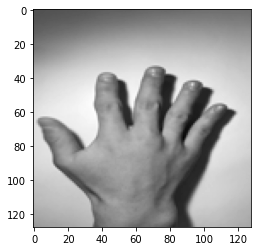

この写真は、 奥谷君の裏 です。
可能性は、 100.0 %です。

ここからは19番目の写真です


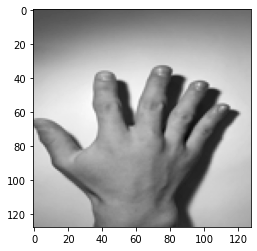

この写真は、 奥谷君の裏 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは20番目の写真です


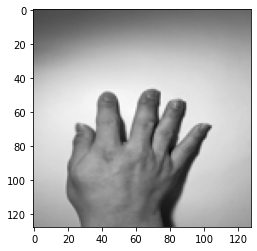

この写真は、 新井さんの表 です。
可能性は、 99.94953870773315 %です。

ここからは21番目の写真です


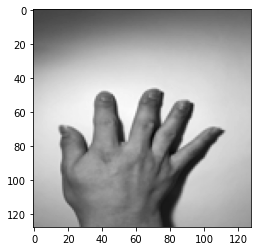

この写真は、 新井さんの表 です。
可能性は、 99.96953010559082 %です。

ここからは22番目の写真です


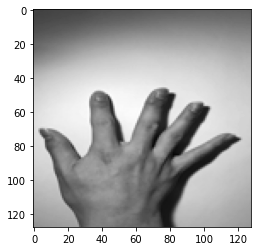

この写真は、 三村君の表 です。
可能性は、 99.99834299087524 %です。

ここからは23番目の写真です


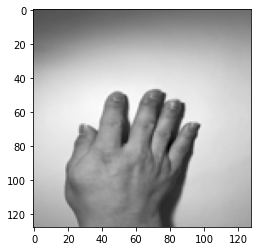

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは24番目の写真です


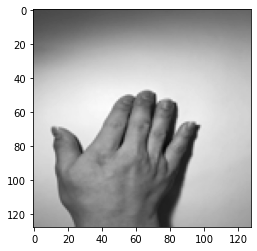

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは25番目の写真です


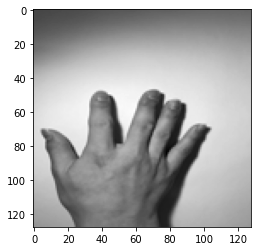

可能性が 83.36799740791321 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは26番目の写真です


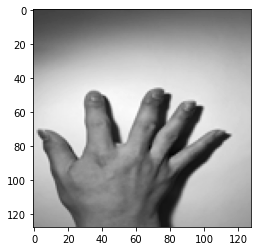

この写真は、 三村君の表 です。
可能性は、 100.0 %です。

ここからは27番目の写真です


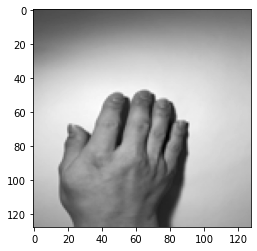

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは28番目の写真です


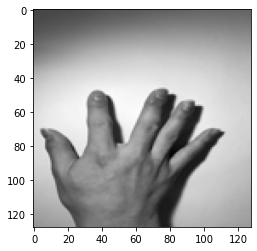

可能性が 98.68374466896057 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは29番目の写真です


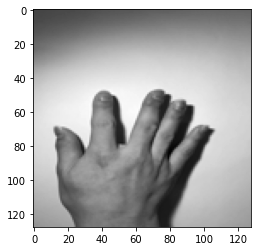

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは30番目の写真です


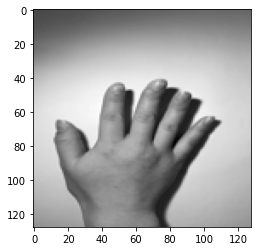

この写真は、 三村君の表 です。
可能性は、 99.93547797203064 %です。

ここからは31番目の写真です


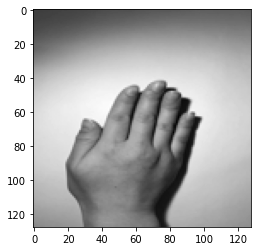

この写真は、 三村君の表 です。
可能性は、 99.99972581863403 %です。

ここからは32番目の写真です


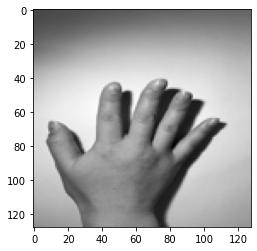

可能性が 94.96625065803528 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは33番目の写真です


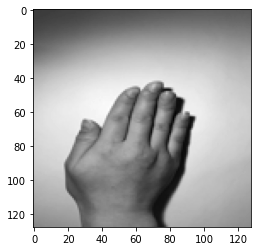

可能性が 74.33159351348877 %なので認証できません。
認証の結果は 後藤さんの裏 でした。

ここからは34番目の写真です


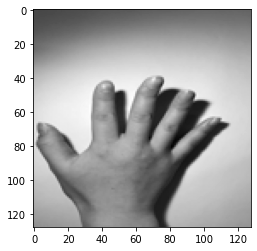

可能性が 55.080610513687134 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは35番目の写真です


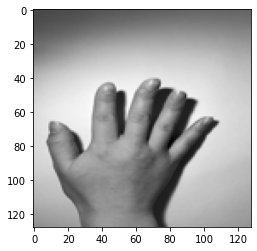

この写真は、 新井さんの表 です。
可能性は、 99.99995231628418 %です。

ここからは36番目の写真です


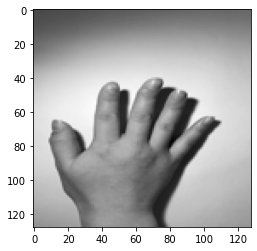

可能性が 80.65160512924194 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは37番目の写真です


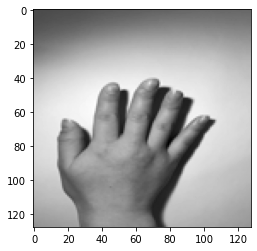

この写真は、 新井さんの表 です。
可能性は、 99.91693496704102 %です。

ここからは38番目の写真です


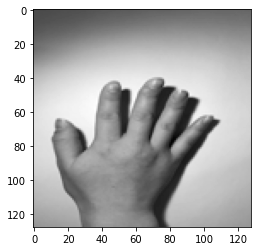

この写真は、 三村君の表 です。
可能性は、 99.47861433029175 %です。

ここからは39番目の写真です


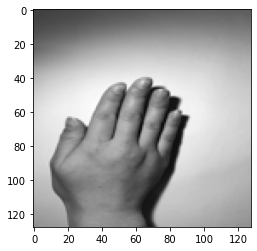

この写真は、 新井さんの表 です。
可能性は、 99.99896287918091 %です。
テスト対象の人が変わります

ここからは40番目の写真です


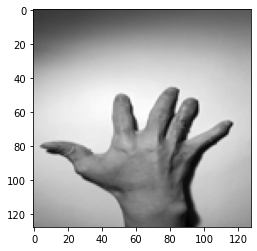

この写真は、 三村君の表 です。
可能性は、 99.88430738449097 %です。

ここからは41番目の写真です


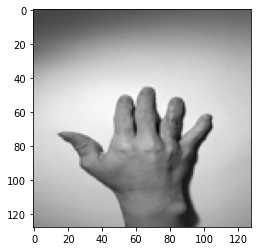

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは42番目の写真です


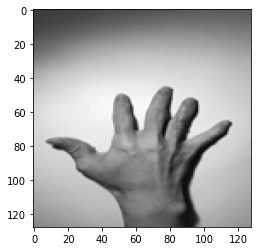

この写真は、 三村君の表 です。
可能性は、 99.9981164932251 %です。

ここからは43番目の写真です


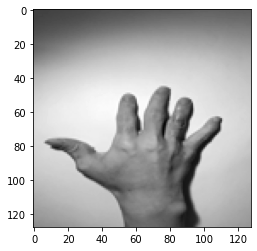

この写真は、 三村君の表 です。
可能性は、 99.9998927116394 %です。

ここからは44番目の写真です


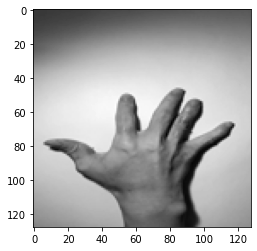

可能性が 96.8782901763916 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは45番目の写真です


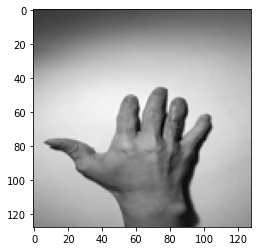

この写真は、 三村君の表 です。
可能性は、 99.11132454872131 %です。

ここからは46番目の写真です


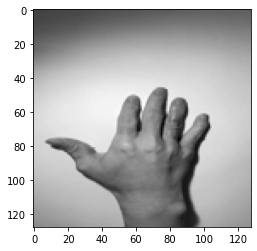

可能性が 98.18760752677917 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは47番目の写真です


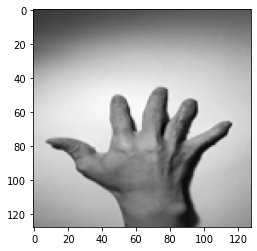

この写真は、 三村君の表 です。
可能性は、 99.99990463256836 %です。

ここからは48番目の写真です


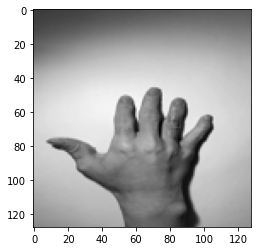

可能性が 56.469565629959106 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは49番目の写真です


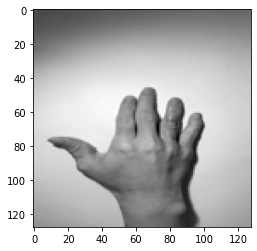

この写真は、 新井さんの裏 です。
可能性は、 99.99998807907104 %です。
テスト対象の人が変わります

ここからは50番目の写真です


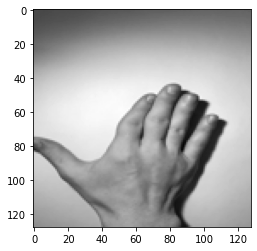

この写真は、 奥谷君の裏 です。
可能性は、 99.2136001586914 %です。

ここからは51番目の写真です


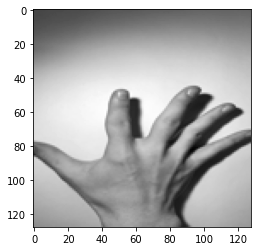

この写真は、 新井さんの裏 です。
可能性は、 99.75302815437317 %です。

ここからは52番目の写真です


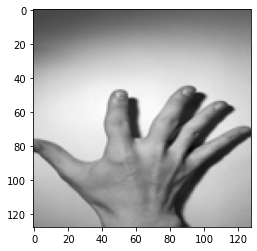

可能性が 95.72227597236633 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは53番目の写真です


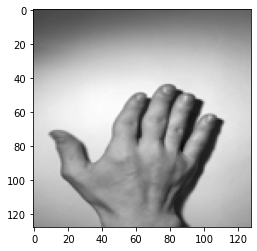

この写真は、 奥谷君の裏 です。
可能性は、 99.99994039535522 %です。

ここからは54番目の写真です


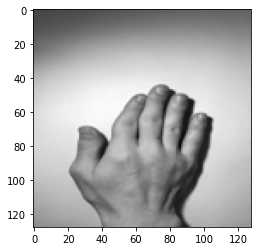

この写真は、 三村君の表 です。
可能性は、 99.71996545791626 %です。

ここからは55番目の写真です


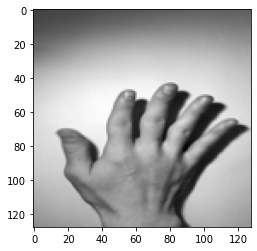

この写真は、 奥谷君の裏 です。
可能性は、 99.67580437660217 %です。

ここからは56番目の写真です


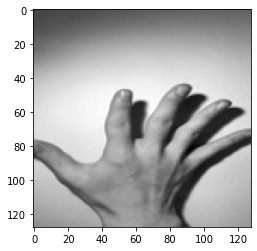

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは57番目の写真です


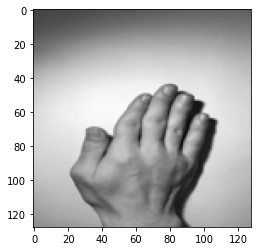

可能性が 97.61373400688171 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは58番目の写真です


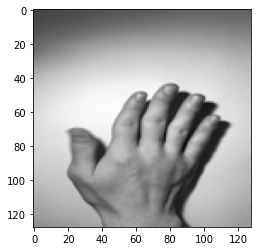

この写真は、 奥谷君の裏 です。
可能性は、 99.99781847000122 %です。

ここからは59番目の写真です


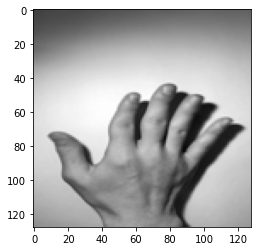

可能性が 90.0888979434967 %なので認証できません。
認証の結果は 奥谷君の裏 でした。
テスト対象の人が変わります

ここからは60番目の写真です


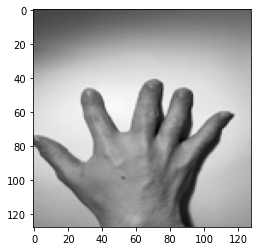

この写真は、 三村君の表 です。
可能性は、 99.99991655349731 %です。

ここからは61番目の写真です


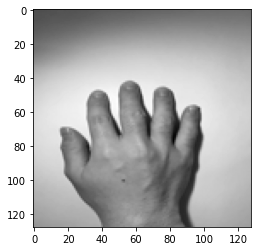

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは62番目の写真です


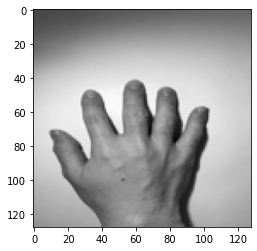

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは63番目の写真です


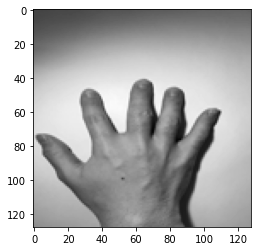

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは64番目の写真です


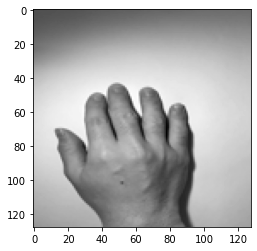

この写真は、 三村君の表 です。
可能性は、 99.85200762748718 %です。

ここからは65番目の写真です


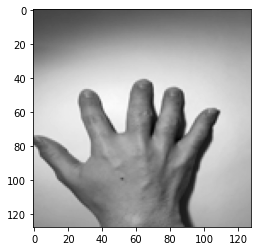

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは66番目の写真です


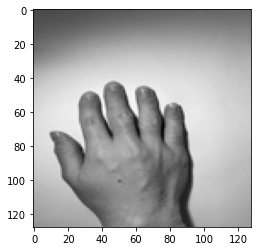

この写真は、 新井さんの裏 です。
可能性は、 100.0 %です。

ここからは67番目の写真です


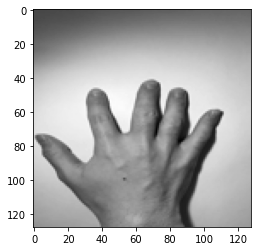

可能性が 97.85315990447998 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは68番目の写真です


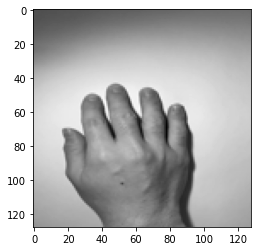

可能性が 94.55152750015259 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは69番目の写真です


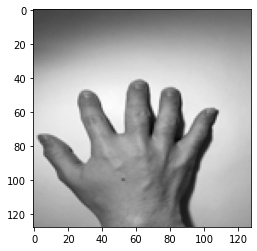

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。
テスト対象の人が変わります

ここからは70番目の写真です


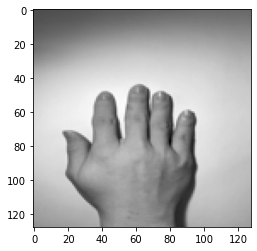

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは71番目の写真です


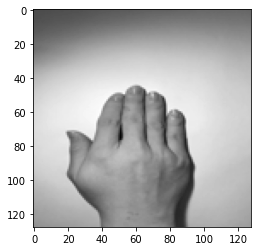

この写真は、 三村君の裏 です。
可能性は、 99.9957799911499 %です。

ここからは72番目の写真です


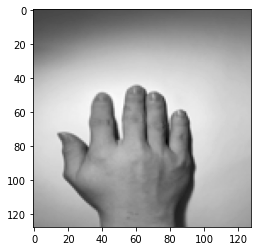

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは73番目の写真です


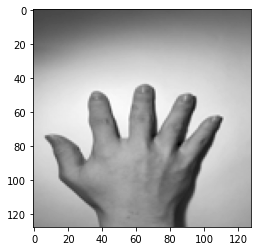

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは74番目の写真です


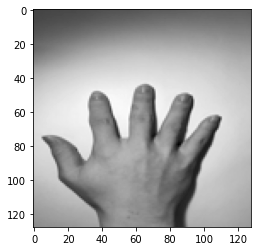

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは75番目の写真です


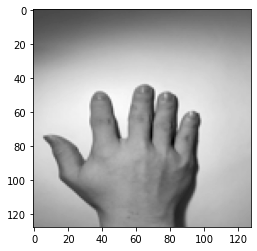

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは76番目の写真です


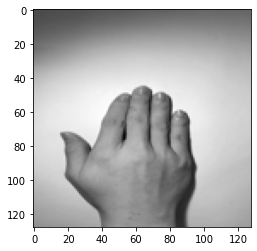

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは77番目の写真です


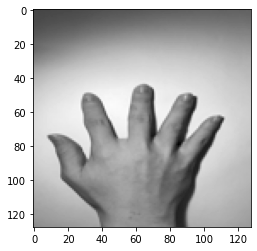

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは78番目の写真です


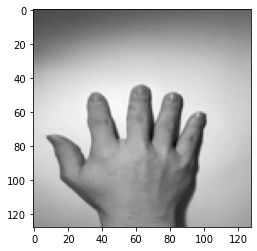

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。

ここからは79番目の写真です


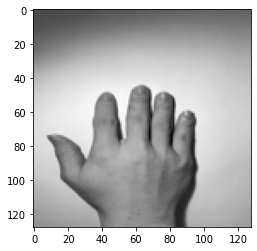

この写真は、 三村君の裏 です。
可能性は、 100.0 %です。
テスト対象の人が変わります


In [11]:
#CNNモデルを用いた機械学習--(pro8)
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(nb_classes, activation='softmax'))
    return model


def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model
'''
omote=["arai/omote","gotou/omote","isii/omote",
       "mimura/omote","mine/omote","nakamura/omote",
       "okutani/omote","saitouhide/omote","saitouryou/omote",
       "sakuma/omote","tanaka/omote","tochikubo/omote",
       "tokuyama/omote","watanabe/omote",
       "yamaguchi/omote"]
ura=["arai/ura","gotou/ura","isii/ura",
       "mimura/ura","mine/ura","nakamura/ura",
       "okutani/ura","saitouhide/ura",
       "saitouryou/ura","sakuma/ura","tanaka/ura",
       "tochikubo/ura","tokuyama/ura","watanabe/ura",
       "yamaguchi/ura"]
'''
#他人受入率用のテスト配列
omote=["tochikubo/omote","saitouhide/omote","saitouryou/omote",
      "sakuma/omote","tanaka/omote","tokuyama/omote","watanabe/omote",
      "yamaguchi/omote"]
ura=["tochikubo/ura","saitouhide/ura","saitouryou/ura",
      "sakuma/ura","tanaka/ura","tokuyama/ura","watanabe/ura",
      "yamaguchi/ura"]
target_omote=[]
target_ura=[]
for k in range(8):#変更必要
    for i in range(10):
        target_omote.append("./graytest/"+str(omote[k])+"/"+str(i)+".jpg")#変更必要
        target_ura.append("./graytest/"+str(ura[k])+"/"+str(i)+".jpg")#変更必要

#target_omote="./test/3nensei/arai/omote/1.jpg"#変更必要
#target_ura="./test/3nensei/arai/ura/1.jpg"#変更必要

im_rows = 128 #変更必要
im_cols = 128 #変更必要
im_color = 1 #変更必要
in_shape = (im_rows, im_cols, im_color)
nb_classes = 14 #変更必要
'''
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
        "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
        "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
        "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏",
        "斎藤ひであきさんの表","斎藤ひであきさんの裏","斎藤りょうがさんの表",
        "斎藤りょうがさんの裏","佐久間さんの表","佐久間さんの裏",
        "田中さんの表","田中さんの裏","徳山さんの表","徳山さんの裏",
        "渡邉さんの表","渡邉さんの裏","山口さんの表","山口さんの裏"]
      #  "関根さんの表","関根さんの裏","鳥海さんの表","鳥海さんの裏",
      #  "相澤さんの表","相澤さんの裏"]
'''
#他人受入率用のラベル
LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
       "中村君の表","中村君の裏",
       "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
       "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏"]
model = get_model(in_shape, nb_classes)
model.load_weights('./hdf/num14graylight128pix.hdf5')#変更必要

def check_photo(path):
    img=Image.open(path)
    #img=img.convert("RGB")
    img=img.resize((im_cols,im_rows))
    plt.imshow(img,cmap='gray')
    plt.show()

    x=np.asarray(img)
    x=x.reshape(-1,im_rows,im_cols,im_color)
    x=x/255
    
    #予測
    pre=model.predict([x])[0]#画像の予測
    idx=pre.argmax()
    per=(pre[idx]*100)
    #per=int(pre[idx]*100)
    return(idx,per)

def check_photo_str(path):
    idx,per=check_photo(path)
    if per>=99:
        print("この写真は、",LABELS[idx],"です。")
        print("可能性は、",per,"%です。")
    else:
        print('\033[31m'+"可能性が",per,"%なので認証できません。"+'\033[31m')
        print("認証の結果は",LABELS[idx],"でした。")
    
if __name__=='__main__':
    number=[9,19,29,39,49,59,69,79,89,99,109,119,129,139,149]
    for i in range(80):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_omote[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")
    for i in range(80):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_ura[i])
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")

In [51]:
#テスト画像をグレースケールに変換
import cv2
import os

output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
for i in range(30):
    save_dir="./graytest/"+str(output[i])
    for k in range(10):
        img=cv2.imread("./test/"+str(output[i])+"/"+str(k)+".jpg")
        outfile=save_dir+"/"+str(k)+".jpg"
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        cv2.imwrite(outfile, img)
        
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok
saitouhide/omote:ok
saitouhide/ura:ok
saitouryou/omote:ok
saitouryou/ura:ok
sakuma/omote:ok
sakuma/ura:ok
tanaka/omote:ok
tanaka/ura:ok
tochikubo/omote:ok
tochikubo/ura:ok
tokuyama/omote:ok
tokuyama/ura:ok
watanabe/omote:ok
watanabe/ura:ok
yamaguchi/omote:ok
yamaguchi/ura:ok



ここからは0番目の写真です


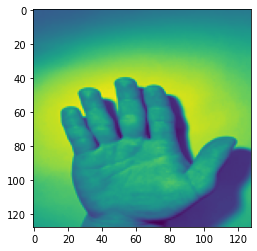

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは1番目の写真です


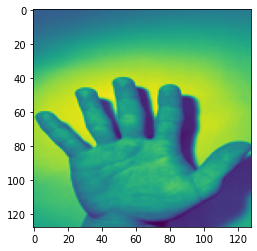

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは2番目の写真です


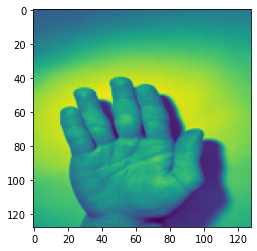

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは3番目の写真です


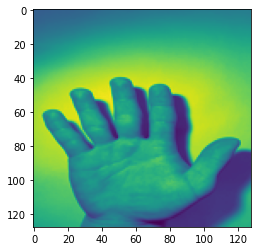

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは4番目の写真です


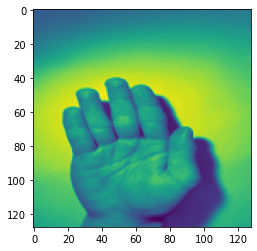

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは5番目の写真です


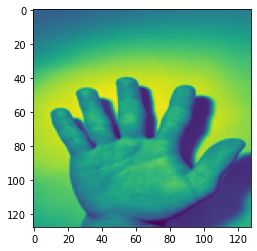

可能性が 94 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは6番目の写真です


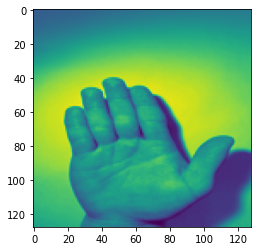

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは7番目の写真です


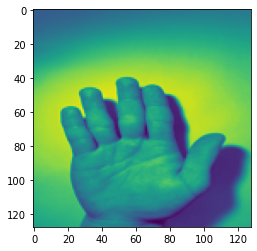

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは8番目の写真です


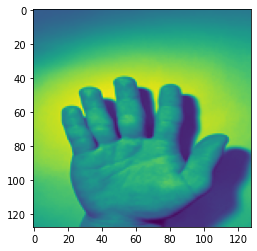

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは9番目の写真です


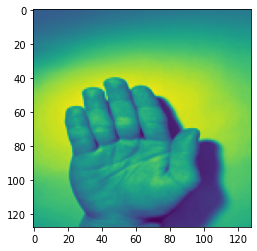

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは10番目の写真です


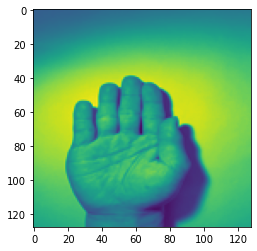

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは11番目の写真です


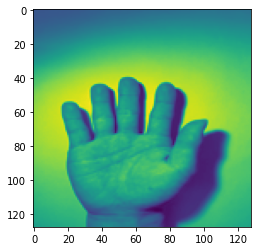

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは12番目の写真です


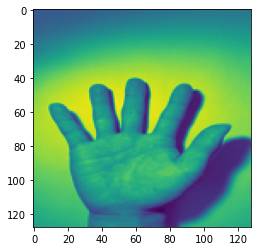

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは13番目の写真です


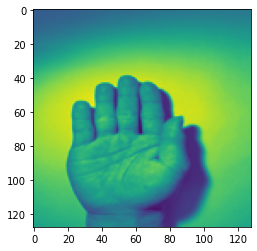

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは14番目の写真です


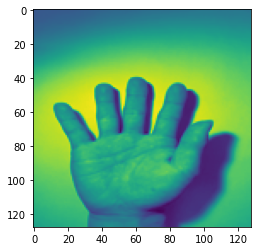

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは15番目の写真です


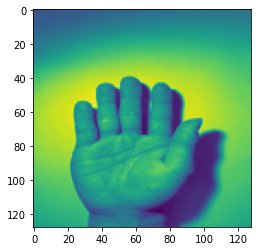

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは16番目の写真です


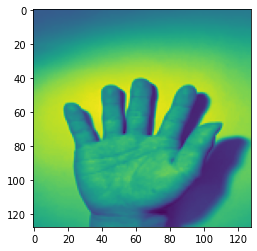

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは17番目の写真です


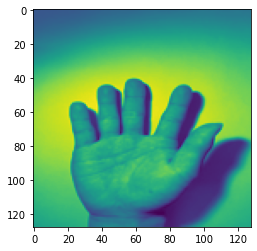

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは18番目の写真です


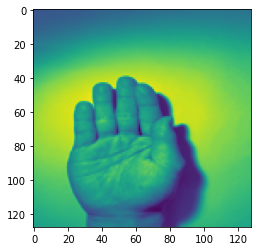

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは19番目の写真です


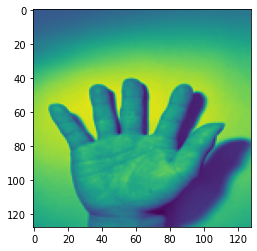

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは20番目の写真です


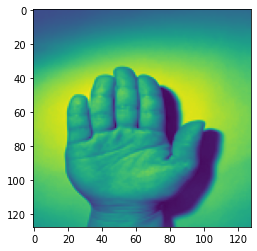

可能性が 96 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは21番目の写真です


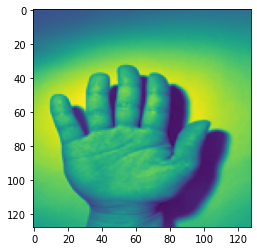

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは22番目の写真です


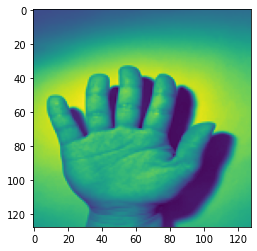

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは23番目の写真です


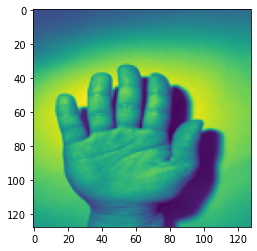

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは24番目の写真です


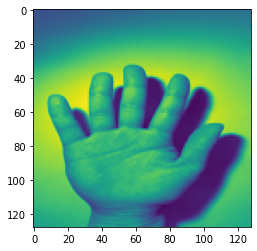

可能性が 95 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは25番目の写真です


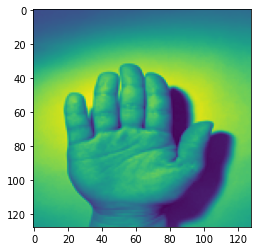

可能性が 97 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは26番目の写真です


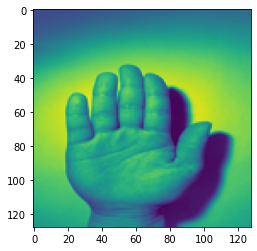

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは27番目の写真です


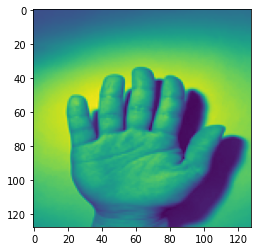

可能性が 82 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは28番目の写真です


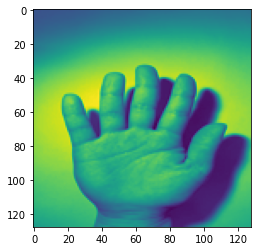

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは29番目の写真です


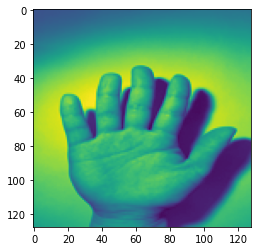

可能性が 95 %なので認証できません。
認証の結果は 三村君の表 でした。
テスト対象の人が変わります

ここからは30番目の写真です


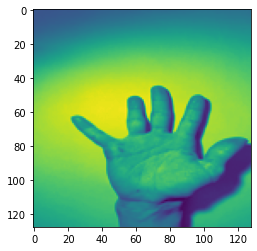

可能性が 88 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは31番目の写真です


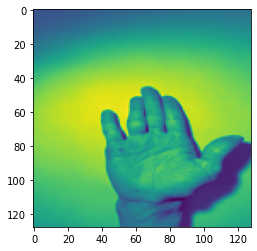

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは32番目の写真です


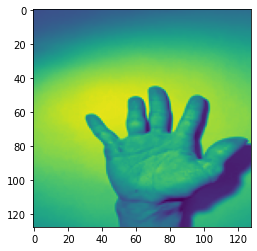

可能性が 91 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは33番目の写真です


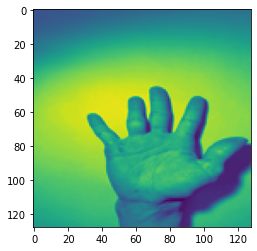

可能性が 92 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは34番目の写真です


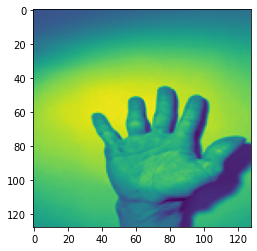

可能性が 65 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは35番目の写真です


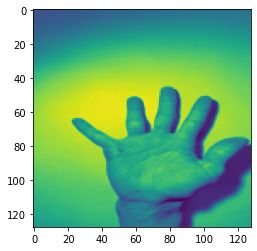

可能性が 80 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは36番目の写真です


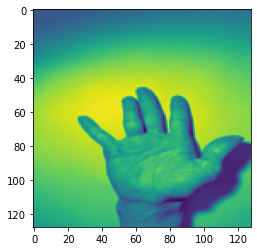

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは37番目の写真です


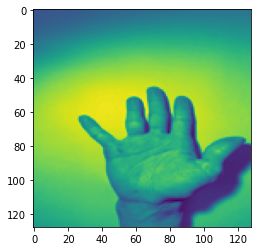

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは38番目の写真です


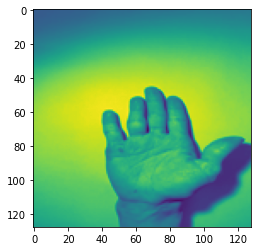

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは39番目の写真です


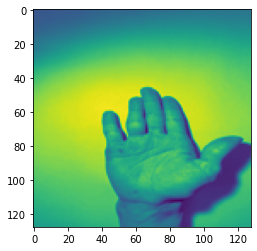

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。
テスト対象の人が変わります

ここからは40番目の写真です


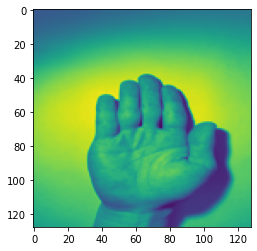

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは41番目の写真です


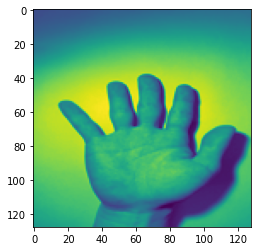

この写真は、 三村君の表 です。
可能性は、 100 %です。

ここからは42番目の写真です


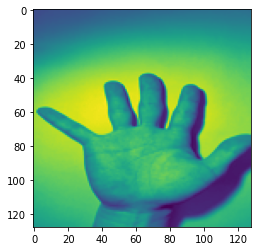

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは43番目の写真です


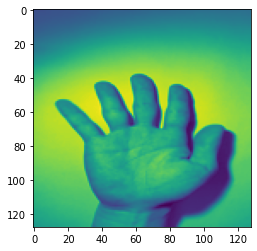

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは44番目の写真です


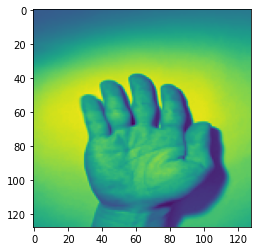

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは45番目の写真です


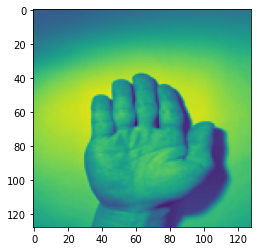

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは46番目の写真です


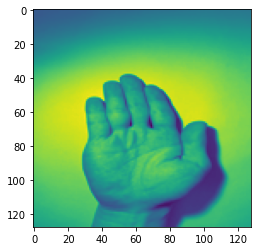

この写真は、 三村君の表 です。
可能性は、 99 %です。

ここからは47番目の写真です


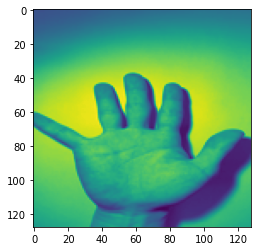

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは48番目の写真です


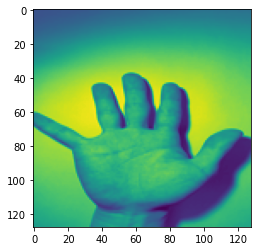

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは49番目の写真です


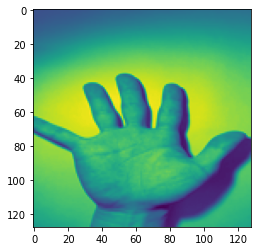

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。
テスト対象の人が変わります

ここからは50番目の写真です


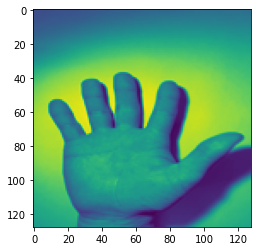

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは51番目の写真です


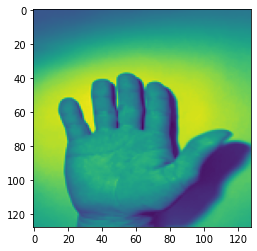

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは52番目の写真です


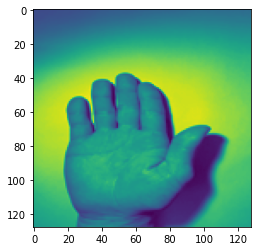

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは53番目の写真です


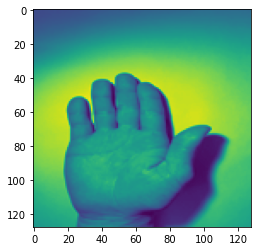

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは54番目の写真です


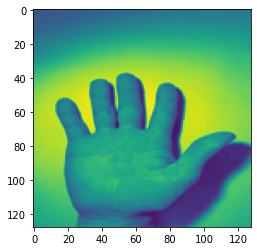

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは55番目の写真です


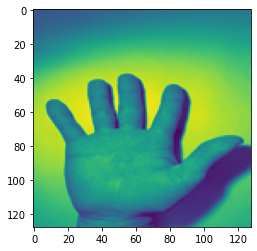

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは56番目の写真です


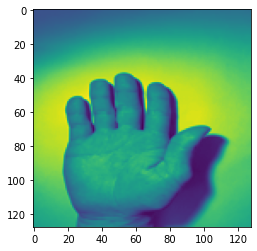

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは57番目の写真です


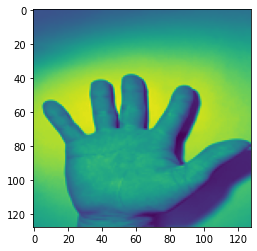

この写真は、 新井さんの表 です。
可能性は、 100 %です。

ここからは58番目の写真です


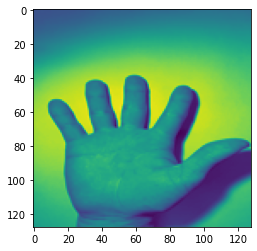

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは59番目の写真です


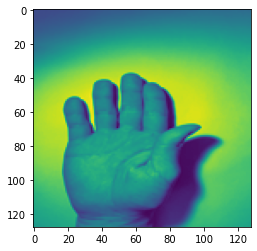

この写真は、 新井さんの表 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは60番目の写真です


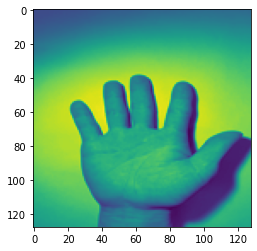

可能性が 53 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは61番目の写真です


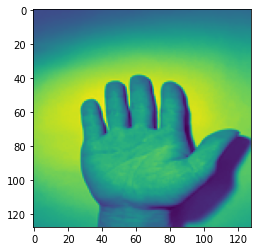

可能性が 61 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは62番目の写真です


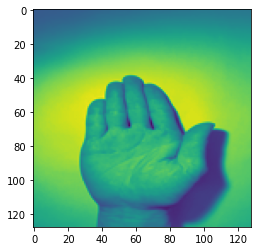

可能性が 98 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは63番目の写真です


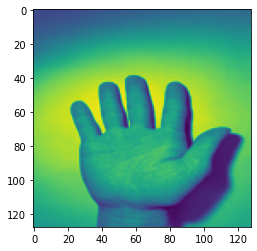

可能性が 86 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは64番目の写真です


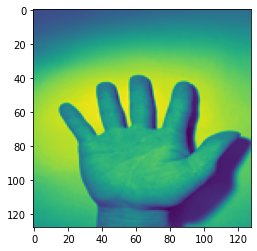

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは65番目の写真です


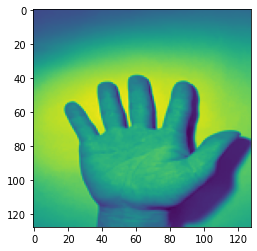

この写真は、 新井さんの表 です。
可能性は、 99 %です。

ここからは66番目の写真です


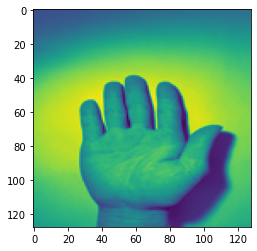

可能性が 84 %なので認証できません。
認証の結果は 三村君の表 でした。

ここからは67番目の写真です


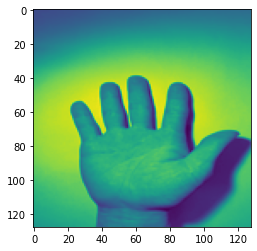

可能性が 92 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは68番目の写真です


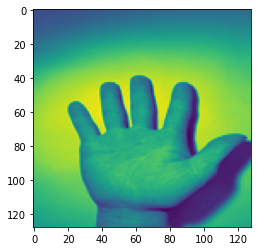

可能性が 98 %なので認証できません。
認証の結果は 新井さんの表 でした。

ここからは69番目の写真です


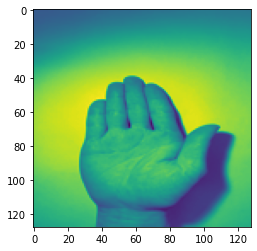

可能性が 95 %なので認証できません。
認証の結果は 三村君の表 でした。
テスト対象の人が変わります

ここからは0番目の写真です


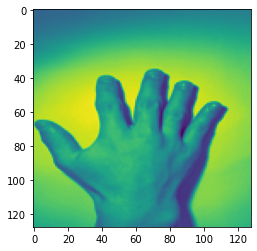

可能性が 94 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは1番目の写真です


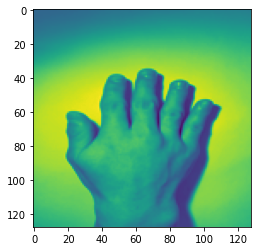

可能性が 98 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは2番目の写真です


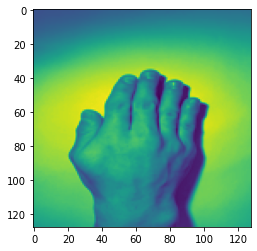

可能性が 89 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは3番目の写真です


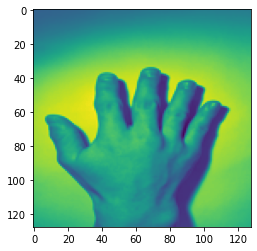

この写真は、 奥谷君の裏 です。
可能性は、 99 %です。

ここからは4番目の写真です


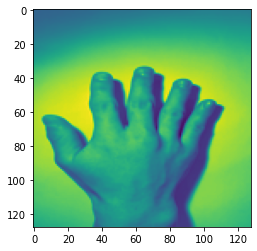

可能性が 41 %なので認証できません。
認証の結果は 江波戸の裏 でした。

ここからは5番目の写真です


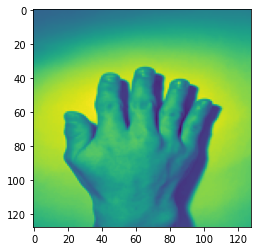

可能性が 85 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは6番目の写真です


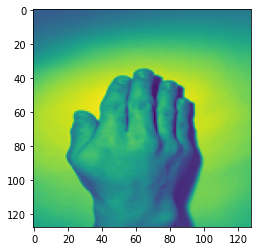

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは7番目の写真です


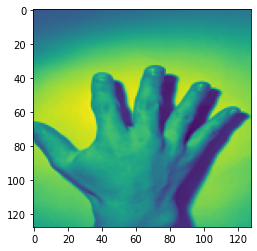

可能性が 60 %なので認証できません。
認証の結果は 石井さんの裏 でした。

ここからは8番目の写真です


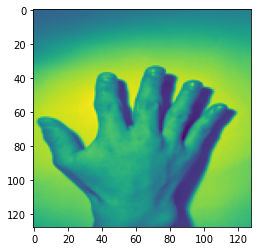

可能性が 88 %なので認証できません。
認証の結果は 奥谷君の裏 でした。

ここからは9番目の写真です


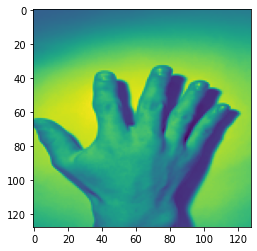

可能性が 77 %なので認証できません。
認証の結果は 奥谷君の裏 でした。
テスト対象の人が変わります

ここからは10番目の写真です


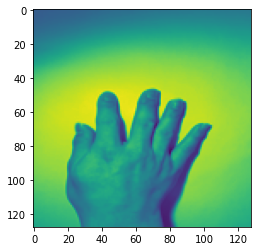

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは11番目の写真です


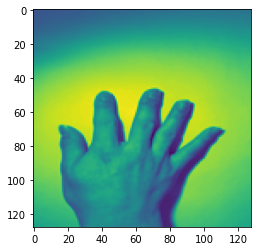

可能性が 60 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは12番目の写真です


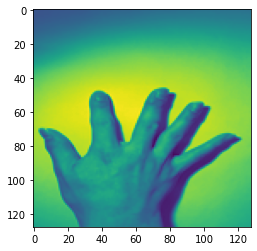

可能性が 90 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは13番目の写真です


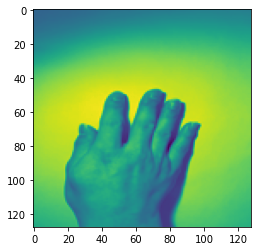

可能性が 97 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは14番目の写真です


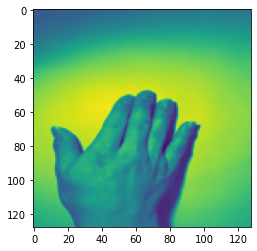

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは15番目の写真です


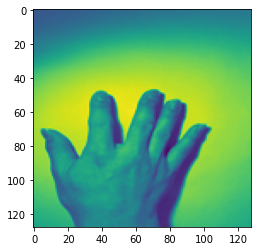

可能性が 85 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは16番目の写真です


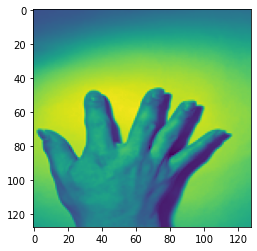

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは17番目の写真です


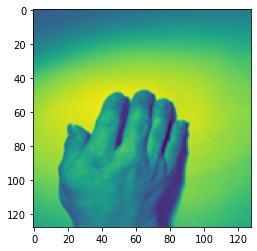

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは18番目の写真です


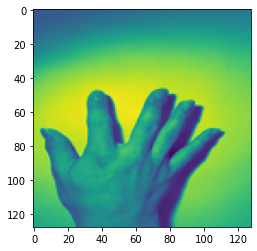

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは19番目の写真です


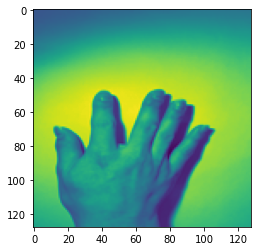

この写真は、 三村君の裏 です。
可能性は、 99 %です。
テスト対象の人が変わります

ここからは20番目の写真です


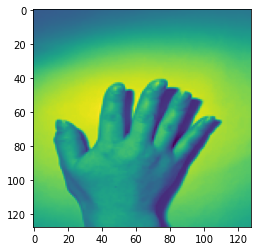

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは21番目の写真です


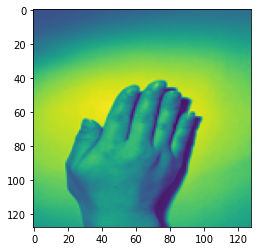

可能性が 85 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは22番目の写真です


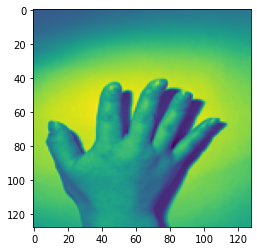

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは23番目の写真です


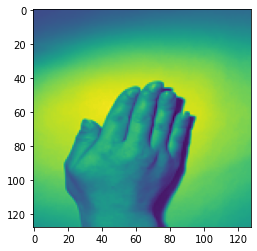

可能性が 83 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは24番目の写真です


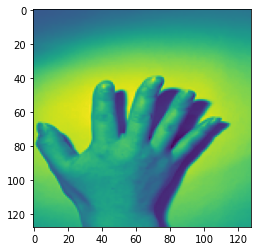

可能性が 79 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは25番目の写真です


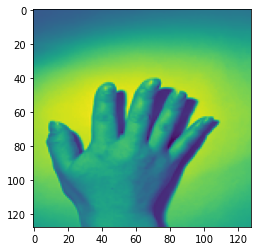

可能性が 71 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは26番目の写真です


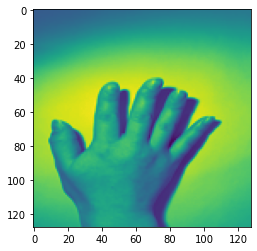

可能性が 88 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは27番目の写真です


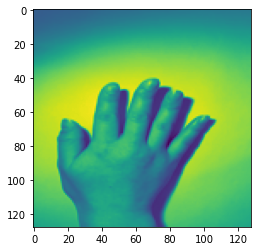

可能性が 77 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは28番目の写真です


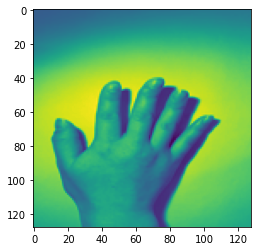

可能性が 91 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは29番目の写真です


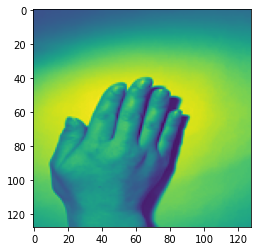

可能性が 55 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは30番目の写真です


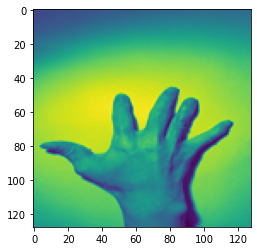

可能性が 90 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは31番目の写真です


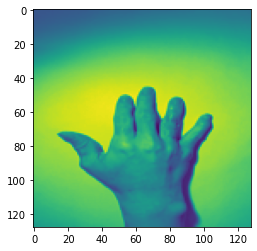

可能性が 71 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは32番目の写真です


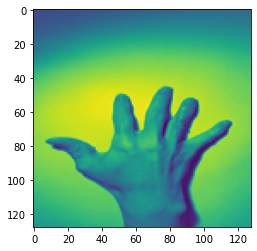

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは33番目の写真です


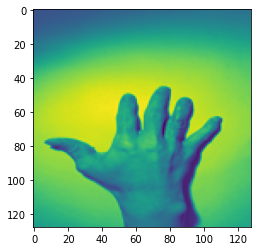

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは34番目の写真です


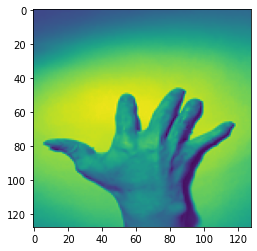

可能性が 72 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは35番目の写真です


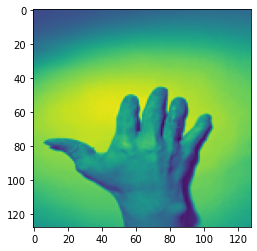

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは36番目の写真です


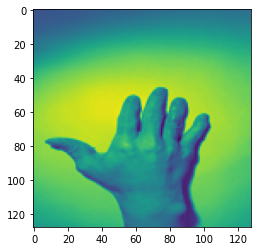

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは37番目の写真です


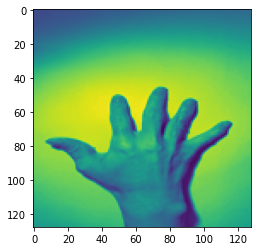

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは38番目の写真です


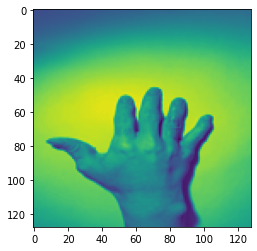

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは39番目の写真です


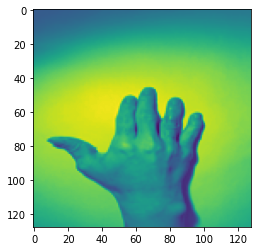

可能性が 96 %なので認証できません。
認証の結果は 三村君の裏 でした。
テスト対象の人が変わります

ここからは40番目の写真です


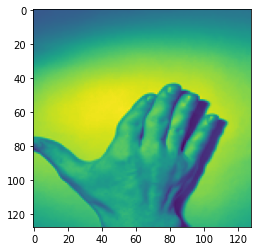

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは41番目の写真です


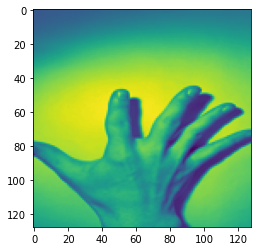

可能性が 98 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは42番目の写真です


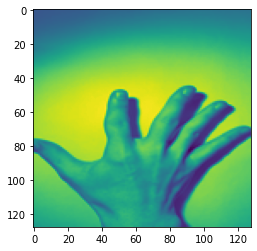

可能性が 98 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは43番目の写真です


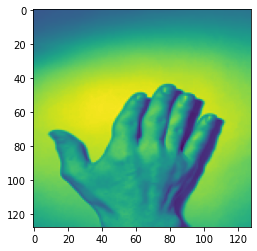

可能性が 65 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは44番目の写真です


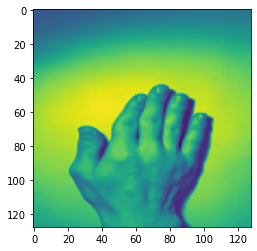

可能性が 52 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは45番目の写真です


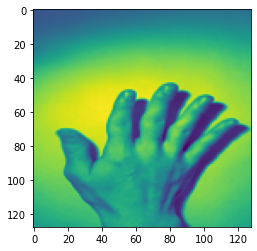

可能性が 87 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは46番目の写真です


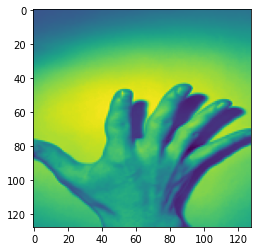

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは47番目の写真です


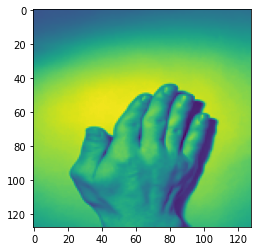

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは48番目の写真です


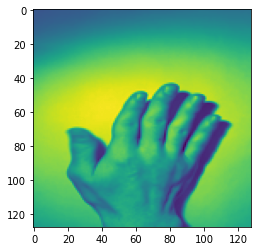

可能性が 91 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは49番目の写真です


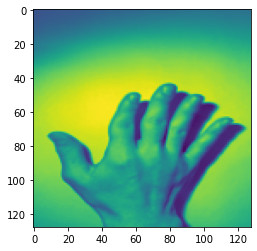

可能性が 89 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは50番目の写真です


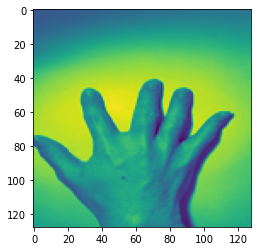

可能性が 96 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは51番目の写真です


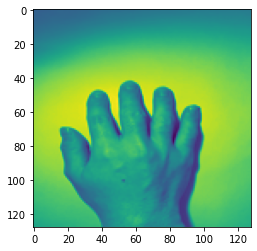

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは52番目の写真です


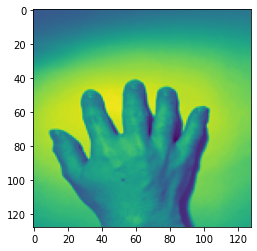

可能性が 89 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは53番目の写真です


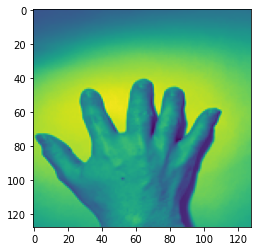

可能性が 76 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは54番目の写真です


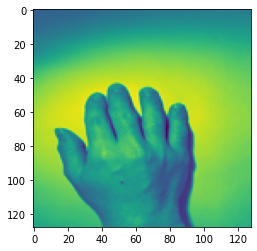

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは55番目の写真です


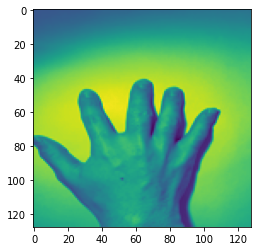

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは56番目の写真です


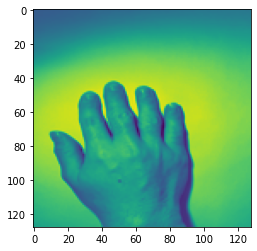

この写真は、 新井さんの裏 です。
可能性は、 99 %です。

ここからは57番目の写真です


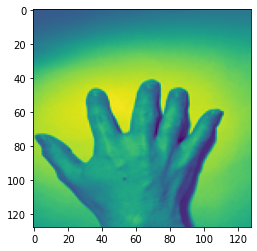

可能性が 58 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは58番目の写真です


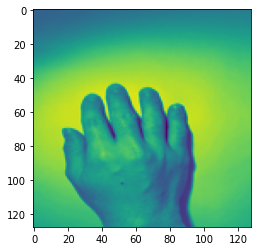

可能性が 97 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは59番目の写真です


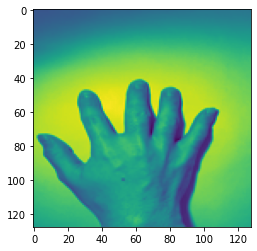

可能性が 64 %なので認証できません。
認証の結果は 新井さんの裏 でした。
テスト対象の人が変わります

ここからは60番目の写真です


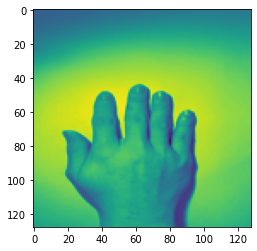

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは61番目の写真です


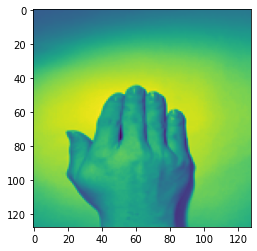

可能性が 92 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは62番目の写真です


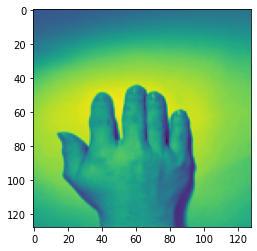

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは63番目の写真です


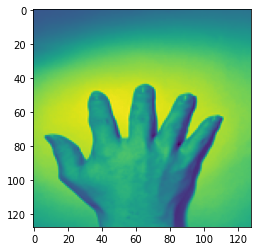

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは64番目の写真です


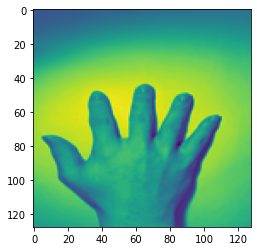

可能性が 95 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは65番目の写真です


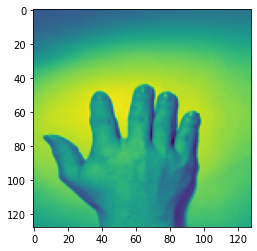

可能性が 98 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは66番目の写真です


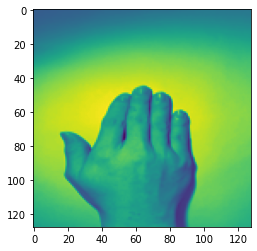

この写真は、 三村君の裏 です。
可能性は、 99 %です。

ここからは67番目の写真です


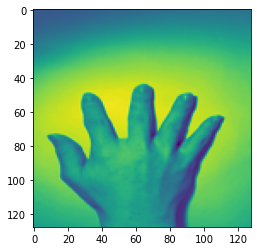

可能性が 90 %なので認証できません。
認証の結果は 新井さんの裏 でした。

ここからは68番目の写真です


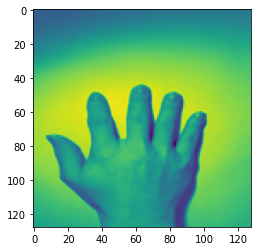

可能性が 85 %なので認証できません。
認証の結果は 三村君の裏 でした。

ここからは69番目の写真です


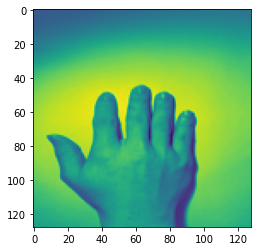

この写真は、 三村君の裏 です。
可能性は、 99 %です。
テスト対象の人が変わります


In [74]:
#他人受入率の評価
import keras 
from keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten
from keras.layers import Conv2D,MaxPooling2D
from keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def def_model(in_shape, nb_classes):
    model = Sequential()
    model.add(Conv2D(32,#畳み込み
              kernel_size=(3, 3),
              activation='relu',
              input_shape=in_shape))
    model.add(Conv2D(32, (3, 3), activation='relu'))#畳み込み
    model.add(MaxPooling2D(pool_size=(2, 2)))#プーリング
    model.add(Dropout(0.25))#ドロップアウト

    model.add(Conv2D(64, (3, 3), activation='relu'))#畳み込み
    model.add(Conv2D(64, (3, 3), activation='relu'))#畳み込み
    model.add(MaxPooling2D(pool_size=(2, 2)))#プーリング
    model.add(Dropout(0.25))#ドロップアウト

    model.add(Flatten())#平滑化
    model.add(Dense(512, activation='relu'))#畳み込み
    model.add(Dropout(0.5))#ドロップアウト
    model.add(Dense(nb_classes, activation='softmax'))#畳み込み
    return model


def get_model(in_shape, nb_classes):
    model = def_model(in_shape, nb_classes)
    model.compile(
        loss='categorical_crossentropy',
        optimizer=RMSprop(),
        metrics=['accuracy'])
    return model
omote=["saitouhide/omote","saitouryou/omote",
       "sakuma/omote","tanaka/omote",
       "tokuyama/omote","watanabe/omote",
       "yamaguchi/omote"]
ura=["saitouhide/ura","saitouryou/ura",
     "sakuma/ura","tanaka/ura",
       "tokuyama/ura","watanabe/ura",
       "yamaguchi/ura"]
target_omote=[]
target_ura=[]
for k in range(7):#変更必要
    for i in range(10):
        target_omote.append("./graytest/"+str(omote[k])+"/"+str(i)+".jpg")#変更必要
        target_ura.append("./graytest/"+str(ura[k])+"/"+str(i)+".jpg")#変更必要

#target_omote="./test/3nensei/arai/omote/1.jpg"#変更必要
#target_ura="./test/3nensei/arai/ura/1.jpg"#変更必要

im_rows = 128 #変更必要
im_cols = 128 #変更必要
im_color = 1  #変更必要RGBなら３
in_shape = (im_rows, im_cols, im_color)
nb_classes = 16 #変更必要

LABELS=["江波戸の表","江波戸の裏","奥谷君の表","奥谷君の裏",
        "栃窪先生の表","栃窪先生の裏","中村君の表","中村君の裏",
        "後藤さんの表","後藤さんの裏","三村君の表","三村君の裏",
        "新井さんの表","新井さんの裏","石井さんの表","石井さんの裏"]

model = get_model(in_shape, nb_classes)
model.load_weights('./hdf/num16graylight128pix.hdf5')#変更必要

def check_photo(path):
    img=Image.open(path)
    #img=img.convert("RGB")
    img=img.resize((im_cols,im_rows))
    plt.imshow(img)
    plt.show()

    x=np.asarray(img)
    x=x.reshape(-1,im_rows,im_cols,im_color)
    x=x/255
    
    #予測
    pre=model.predict([x])[0]
    idx=pre.argmax()
    per=int(pre[idx]*100)
    return(idx,per)

def check_photo_str(path):
    idx,per=check_photo(path)
    if per>=99:
        print("この写真は、",LABELS[idx],"です。")
        print("可能性は、",per,"%です。")
    else:
        print('\033[31m'+"可能性が",per,"%なので認証できません。")
        print("認証の結果は",LABELS[idx],"でした。")
    
if __name__=='__main__':
    number=[9,19,29,39,49,59,69,79,89,99,109,119,129,139,149]
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_omote[i])
        #numberの中身の数字と比較
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")
    for i in range(70):
        print("\nここからは"+str(i)+"番目の写真です")
        check_photo_str(target_ura[i])
        #numberの中身の数字と比較
        for l in range(15):
            if i==number[l]:
                print("================================================")
                print("テスト対象の人が変わります")
                print("================================================")

-------------------------------------------------------
画像の中身
[[[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [100 105 104]
  [100 105 104]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [100 105 104]
  [ 99 104 103]
  [ 99 104 103]]

 [[ 75  81  80]
  [ 75  81  80]
  [ 75  81  80]
  ...
  [ 99 104 103]
  [ 98 103 102]
  [ 97 102 101]]

 ...

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [148 152 153]
  [147 151 152]
  [147 151 152]]

 [[139 142 147]
  [138 141 146]
  [138 141 146]
  ...
  [147 151 152]
  [147 151 152]
  [147 151 152]]]
-------------------------------------------------------
解像度
(1080, 1920)
-------------------------------------------------------
画像のモード
RGB
-------------------------------------------------------
画像の中身
[[ 80  80  80 ... 104 104 104]
 [ 80  80  80 ... 104 103 103]
 [ 80  80  80 ... 103 102 101]
 ...
 [143 14

<function matplotlib.pyplot.show(close=None, block=None)>

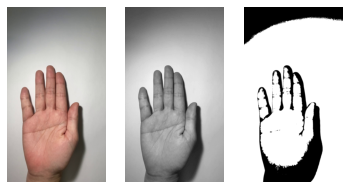

In [18]:
#画像の内部構造を知るためのプログラム
import cv2
import os 
import matplotlib.pyplot as plt
from PIL import Image


img=cv2.imread("./test/arai/omote/0.jpg")
image = Image.open('./test/arai/omote/0.jpg')
#plt.subplot(1,2,1)
print("-------------------------------------------------------")
print("画像の中身")
print(img)
print("-------------------------------------------------------")
print("解像度")
print(image.size)
print("-------------------------------------------------------")
print("画像のモード")
#RGBの場合3x8 bit/pixel カラー画像
print(image.mode)
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show

#グレイスケールの場合
image2 = Image.open('./graytest/arai/omote/0.jpg')
img2=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print("-------------------------------------------------------")
print("画像の中身")
print(img2)
print("-------------------------------------------------------")
print("解像度")
print(image2.size)
print("-------------------------------------------------------")
print("画像のモード")
print(image2.mode)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
plt.subplot(1,3,2)
plt.imshow(img2)
plt.axis("off")
plt.show


#バイナリ値の場合
#img3 = cv2.imread('./graytest/arai/omote/0.jpg')
ret, bi_img = cv2.threshold(img2, 127, 255, cv2.THRESH_BINARY)#1つ目の戻り値が閾値、2つ目が画像
cv2.imwrite("./binary.jpg" , bi_img)#binaryでバイナリ画像に変換
image3 = Image.open("./binary.jpg")
print("-------------------------------------------------------")
print("画像の中身")
print(bi_img)
print("-------------------------------------------------------")
print("解像度")
print(image3.size)
print("-------------------------------------------------------")
print("画像のモード")
print(image3.mode)
print(image3)
#Lの場合8 bit/pixel 白黒画像
plt.gray()
plt.subplot(1,3,3)
plt.imshow(bi_img)
plt.axis("off")
plt.show


In [37]:
#バイナリ用のプログラム
import cv2
import os
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura","saitouhideakiomote",
      "saitouhideakiura","saitouryougaomote","saitouryougaura","sakumaomote","sakumaura",
      "tanakaomote","tanakaura","tochiomote","tochiura","tokuyamaomote","tokuyamaura",
      "watanabeomote","watanabeura","yamaguchiomote","yamaguchiura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura","saitouhide/omote","saitouhide/ura","saitouryou/omote",
       "saitouryou/ura","sakuma/omote","sakuma/ura","tanaka/omote","tanaka/ura","tochikubo/omote",
       "tochikubo/ura","tokuyama/omote","tokuyama/ura","watanabe/omote","watanabe/ura",
       "yamaguchi/omote","yamaguchi/ura"]
'''
inputname=["araiomote","araiura","gotoomote","gotoura","isiiomote","isiiura","mimuraomote","mimuraura",
      "mineomote","mineura","nakaomote","nakaura","okuomote","okuura"]
output=["arai/omote","arai/ura","gotou/omote","gotou/ura","isii/omote","isii/ura",
       "mimura/omote","mimura/ura","mine/omote","mine/ura","nakamura/omote","nakamura/ura",
       "okutani/omote","okutani/ura"]

for i in range(14):#変更必要
    save_dir="./binaryhands/"+str(output[i])
    cap=cv2.VideoCapture("./MOV/"+str(inputname[i])+".MOV")
    if not cap.isOpened():
        sys.exit()
    n= 0
    while True:
        # read()でフレーム画像が読み込めたかを示すbool、フレーム画像の配列ndarrayのタプル
        is_image,frame_img = cap.read()
        if is_image:
            # 画像を保存
            outfile=save_dir+"/"+str(n)+".jpg"
            im_gray = cv2.cvtColor(frame_img, cv2.COLOR_BGR2GRAY)
            ret, bi_img = cv2.threshold(im_gray, 127, 255, cv2.THRESH_BINARY)
            cv2.imwrite(outfile, bi_img)#binaryでバイナリ画像に変換
        else:
            # フレーム画像が読込なかったら終了
            break
        n += 1

    cap.release()
    print(str(output[i])+":ok")

arai/omote:ok
arai/ura:ok
gotou/omote:ok
gotou/ura:ok
isii/omote:ok
isii/ura:ok
mimura/omote:ok
mimura/ura:ok
mine/omote:ok
mine/ura:ok
nakamura/omote:ok
nakamura/ura:ok
okutani/omote:ok
okutani/ura:ok


In [19]:
#バイナリ用のnumpy保存プログラム
import numpy as np
from PIL import Image
import cv2
import os,glob,random

outfile="./num14binarylight128.npz"#変更必要
max_photo=40000
photo_size=128#変更必要
x=[]
y=[]

def main():
    glob_files("./binaryhands/mine/omote",0)
    glob_files("./binaryhands/mine/ura",1)
    glob_files("./binaryhands/okutani/omote",2)
    glob_files("./binaryhands/okutani/ura",3)
    #glob_files("./hands/tochikubo/omote",4)
    #glob_files("./hands/tochikubo/ura",5)
    glob_files("./binaryhands/nakamura/omote",4)
    glob_files("./binaryhands/nakamura/ura",5)
    glob_files("./binaryhands/gotou/omote",6)
    glob_files("./binaryhands/gotou/ura",7)
    glob_files("./binaryhands/mimura/omote",8)
    glob_files("./binaryhands/mimura/ura",9)
    glob_files("./binaryhands/arai/omote",10)
    glob_files("./binaryhands/arai/ura",11)
    glob_files("./binaryhands/isii/omote",12)
    glob_files("./binaryhands/isii/ura",13)
    #glob_files("./hands/saitouhide/omote",16)
    #glob_files("./hands/saitouhide/ura",17)
    #glob_files("./hands/saitouryou/omote",18)
    #glob_files("./hands/saitouryou/ura",19)
    #glob_files("./hands/sakuma/omote",20)
    #glob_files("./hands/sakuma/ura",21)
    #glob_files("./hands/tanaka/omote",22)
    #glob_files("./hands/tanaka/ura",23)
    #glob_files("./hands/tokuyama/omote",24)
    #glob_files("./hands/tokuyama/ura",25)
    #glob_files("./hands/watanabe/omote",26)
    #glob_files("./hands/watanabe/ura",27)
    #glob_files("./hands/yamaguchi/omote",28)
    #glob_files("./hands/yamaguchi/ura",29)
    #glob_files("./hands/sekine/omote",30)
    #glob_files("./hands/sekine/ura",31)
    #glob_files("./hands/toriumi/omote",32)
    #glob_files("./hands/toriumi/ura",33)
    #glob_files("./hands/aizawa/omote",34)
    #glob_files("./hands/aizawa/ura",35)
    np.savez(outfile,x=x,y=y)
    print("保存しました:"+outfile,len(x))
    print(x[0],y[0])
    
def glob_files(path,label):
    files=glob.glob(path+"/*.jpg")
    random.shuffle(files)
    num=0
    for f in files:
        if num>=max_photo: break
        num+=1
        #img=Image.open(f)#RGBのコード
        #img=img.resize((photo_size,photo_size))
        
        #---------Grayscaleの時のプログラム--------------
        img=cv2.imread(f)
        img_gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, bi_img = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
        bi_img=cv2.resize(bi_img,(photo_size,photo_size))
        
        
        bi_img=np.asarray(bi_img)#1つの配列に格納（この場合2つ）
        x.append(bi_img)
        y.append(label)
if __name__=='__main__':
    main()

保存しました:./num14binarylight128.npz 3051
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]] 0


[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]
[[255 255 255 ... 255 255 255]
 [255   0 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


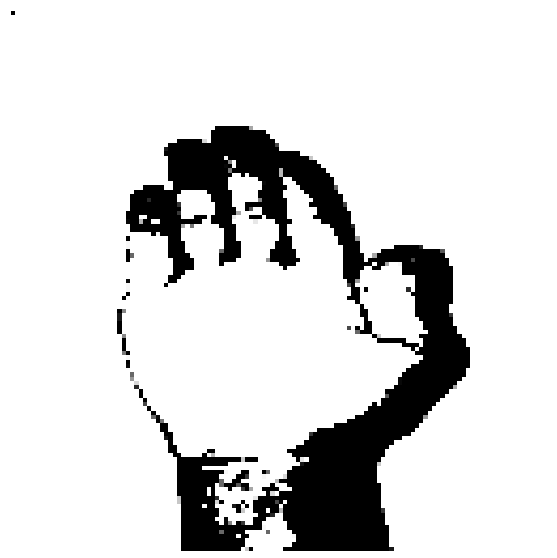

In [22]:
#バイナリファイルの中身を確認するプログラム
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#写真データ読み込み
photos=np.load('./num14binarylight128.npz')
x=photos['x']
y=photos['y']
#開始インデックス
idx=1900
#pyplotで出力
plt.figure(figsize=(10,10))
plt.axis("off")
print(x[0])
print(x[1])
#image = plt.imread(x[20])
#image.shape
#plt.imsave('./extract.jpg', image)
'''
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.axis("off")
    #グレイスケール画像を読み込むときは、plt.grayが必要
    #plt.gray
    plt.title(y[i+idx])
    plt.imshow(x[i+idx],cmap='gray')
    #plt.savefig('./extract.jpg')
'''
#--------------------画像1枚をピックアップして保存する-----------------------------
plt.imshow(x[0],cmap='gray')
plt.imshow(x[1],cmap='gray')
#plt.savefig('./extract.jpg')
plt.show()